# Calculate the Binary LGE hit or miss ratios
Between LGE Segments and Segments defined by Circle or Tarique

## Column: 'Tarique abnormal'

bullsplot used here
tarique, bullsplot, motion curves
11 - mid inferolateral 

first: quality check: single segments only is very rare, two segments are better/more often that means more plausible. Not just the septum is affected. If all segments are affected, tracking may be wrong. 
second: based on experience, 11 and 12 AHA are mostly affected. Check also on circumferential and radial strain values, are they low? Bullseye plot is used for help.

## Column: 'Strain diff' 

Bezieht sich auf die orginal column: 'Segment from strain if different'

- tarique says this is difference between D and F
- tarique says this column is not helpful
- tarique says this columns relates to if different from LGE

He also said that this column shows the additional segments when he applies the Strain thresholding



# Define some helper functions (moved to the python module "Evaluate")

In [1]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

%matplotlib inline
%reload_ext autoreload
%autoreload 2
import ipywidgets
from ipywidgets import interact, interact_manual
import ipywidgets as widgets
import os
import pandas as pd
import numpy as np
np.random.seed(42)
import matplotlib.pyplot as plt
import seaborn as sb
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.Evaluation import create_df_peak, get_pvals_uncorrected, get_pvals_corrected, cross_validate_f1, create_grid_search, ttest_per_keyframe, plot_strain_per_time, plot_report

search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/dynamic-cmr-models


# Read the dmd dataframe with all timesteps

In [2]:
from ipyfilechooser import FileChooser
# /mnt/ssd/git/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/
# /mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/

import os
path_chooser = FileChooser(os.path.join(os.getcwd(),'/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation/'), '')
# integrate 25 healthy control patients
load_controls_checkbox = widgets.Checkbox(
    value=False,
    description='load controls',
    disabled=False,
    indent=False
)
display(path_chooser, load_controls_checkbox)
@interact_manual
def load_strain_values():
    global df_strain_comp, df_strain_p2p, load_controls
    
    #/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2
    #df_strain_comp = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_ed2p.csv')
    #df_strain_p2p = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_p2p.csv')
    df_strain_comp = pd.read_csv(os.path.join(path_chooser.selected, 'df_DMD_time_ed2p.csv'))
    df_strain_p2p = pd.read_csv(os.path.join(path_chooser.selected,'df_DMD_time_p2p.csv'))
    df_strain_comp['dmd'] = 1
    df_strain_p2p['dmd'] = 1

    
    if load_controls_checkbox.value:
        try: # integration of the controls, if requested/given
            df_strain_comp_c = pd.read_csv(os.path.join(path_chooser.selected, 'controls','df_DMD_time_ed2p.csv'))
            df_strain_p2p_c = pd.read_csv(os.path.join(path_chooser.selected,'controls','df_DMD_time_p2p.csv'))
            print('concat some controls!', df_strain_comp.shape)
            df_strain_comp_c['dmd'] = 0
            df_strain_p2p_c['dmd'] = 0
            df_strain_comp_c.sort_values(by=['pat', 'aha'], inplace=True)
            df_strain_p2p_c.sort_values(by=['pat', 'aha'], inplace=True)

            df_strain_comp = pd.concat([df_strain_comp, df_strain_comp_c], axis=0)
            df_strain_p2p = pd.concat([df_strain_p2p, df_strain_p2p_c], axis=0) 
            print('found some controls!', df_strain_comp.shape)
        except Exception as e:
            print('load controls failed with: {}'.format(str(e)))

    df_strain_comp.sort_values(by=['pat', 'aha'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha'], inplace=True)
    print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
    print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])

    #df_strain_comp = df_strain_comp.fillna(df_strain_comp.mean())
    #df_strain_p2p = df_strain_p2p.fillna(df_strain_p2p.mean())

    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
    print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])
    print(df_strain_comp.shape)
    print(df_strain_p2p.shape)
    df_strain_comp.head()
    # we need to make sure that we differentate lge pos/neg on a patient level on all segments, not only on the segments of interest
    print(df_strain_comp.describe())

FileChooser(path='/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation', filename='', title='HTM…

Checkbox(value=False, description='load controls', indent=False)

interactive(children=(Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widge…

# Choose the features for the patient-based LGE+ classification

In [4]:
# Pipeline with all cells for classification
@interact_manual
def choose_features(df_strain_comp=['df_strain_comp'], df_strain_p2p=['df_strain_p2p'],
                    segments=[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], [5,6,7,8,9,10,11,12]],
                    target=['lge', 'lgeef','dmd', 'first_split'],
                    threshold='0',
                    p2p_features=True,
                    use_ED=False,
                    use_MS=False,
                    use_ES=False,
                    use_PF=False,
                    use_MD=False,
                    per_patient=True,
                    p2p=True,
                    comp=False,
                    peak=False,
                    argmax=False,
                   cs=True,
                   rs=False):
    global x_train,y_train, df_peak
    threshold = float(threshold)
    df_strain_comp = globals().get(df_strain_comp)
    df_strain_p2p = globals().get(df_strain_p2p)
    
    df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()>0).values
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()/5).values
    y = (df_strain_p2p[df_strain_p2p['phase']==0].groupby('pat')[target].sum()>threshold).values
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()>threshold).values
    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print('lge pos: ', y.sum(), 'lge neg: ', (y==False).sum())
    
    print('shape: p2p strain df: ',df_strain_p2p.shape)
    #df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments)]
    #df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments)]
    print('shape: p2p strain df: ',df_strain_p2p.shape)
    
    df_peak = create_df_peak(df_strain_comp=df_strain_comp,df_strain_p2p=df_strain_p2p)
    df_peak.sort_values(by=['pat', 'aha'], inplace=True)
    xs = []
    ps = [i for i,bool_ in enumerate([use_ED, use_MS, use_ES, use_PF, use_MD]) if bool_]
    
    if p2p_features:
        cs_phases = [1,2,3,4]
        rs_phases = [3]
        cs_comp_phases = [1,2,3]
        xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(cs_phases)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(cs_comp_phases)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(rs_phases)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(rs_phases)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))

    else:
        if per_patient:
            if any(ps): # select the phases manually
                print(ps)
                if p2p:
                    if cs:xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:
                        temp = np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32)
                        '''temp = np.array([temp[:,:6],temp[:,6:12],np.stack([temp[:,12], temp[:,13],temp[:,13], temp[:,14], temp[:,15], temp[:,15]], axis=1)])
                        temp = np.gradient(temp)[1]
                        print(temp.shape)
                        temp = np.concatenate([temp[:,0], temp[:,1], temp[:,2,0:2],temp[:,2,3:4]], axis=1)
                        print(temp.shape)
                        temp = temp.reshape(57,16)'''
                        xs.append(temp)
                    assert all(y == (df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])[target].sum()>threshold).values)
                if comp:
                    if cs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                    assert all(y == (df_strain_comp[df_strain_p2p['phase']==0].groupby(['pat'])[target].sum()>0).values)
            else: # use the peak or use all phases
                if peak and p2p and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32)) 
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif peak and p2p and argmax:
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and not argmax:
                    print('use p2p peak by phase')
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                elif peak and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif not peak and comp:
                    if cs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                elif not peak and p2p:
                    if cs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))

        else: # per segment classification
            y = np.stack(df_strain_comp.groupby(['pat','aha'])[target].apply(list).values).astype(np.float32)
            y = y.sum(axis=1)>0
            if p2p:
                if cs: xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                if rs: xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
            if comp:
                if cs: xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                if rs: xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
    x = np.concatenate(xs, axis=1)
    print('shape x:', x.shape)
    print('shape y:', y.shape)
    x_train = x
    y_train = y
        
    cross_validate_f1(x_train,y_train)

interactive(children=(Dropdown(description='df_strain_comp', options=('df_strain_comp',), value='df_strain_com…

# Gridsearch with the features from the previous cell

In [20]:
# split the data further into train/test
# use the train split in a CV grid search to find the optimal parameters
# Use the refit function of the gs instance to than predict the labels of the test split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.20, random_state=42, stratify=y_train)
print('len train:',len(x_train))
print('len test:', len(x_test))

len train: 45
len test: 12


In [21]:
gs = create_grid_search(refit='f1')
gs = gs.fit(x_train, y_train)

# create a df from the gs results
results = pd.DataFrame.from_dict(gs.cv_results_)
results["params_str"] = results.params.apply(str)
pd.set_option('display.max_colwidth', None)
results.shape

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

(6165, 82)

In [22]:
# sort by balanced acc
results.sort_values(by=['rank_test_balanced_accuracy','rank_test_recall','rank_test_f1'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
3712,0.800,0.96,0.64,0.800,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 20, 'clf__class_weight': None, 'clf__degree': 4, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': MinMaxScaler()}"
3172,0.765,0.91,0.62,0.765,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': MinMaxScaler()}"
12,0.760,0.86,0.66,0.760,"{'clf': RandomForestClassifier(class_weight='balanced', random_state=1), 'clf__class_weight': 'balanced', 'clf__n_estimators': 10, 'scaler': StandardScaler()}"
13,0.760,0.86,0.66,0.760,"{'clf': RandomForestClassifier(class_weight='balanced', random_state=1), 'clf__class_weight': 'balanced', 'clf__n_estimators': 10, 'scaler': MinMaxScaler()}"
14,0.760,0.86,0.66,0.760,"{'clf': RandomForestClassifier(class_weight='balanced', random_state=1), 'clf__class_weight': 'balanced', 'clf__n_estimators': 10, 'scaler': None}"


In [23]:
# sort by spens
results.sort_values(by=['rank_test_sens','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
869,0.710,0.42,1.0,0.710,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
329,0.685,0.37,1.0,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': None, 'clf__degree': 4, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
437,0.685,0.37,1.0,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': None, 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
761,0.685,0.37,1.0,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 4, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
1659,0.640,0.28,1.0,0.640,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': StandardScaler()}"


In [24]:
# sort by f1
results.sort_values(by=['rank_test_f1','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
869,0.710,0.42,1.00,0.710,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
329,0.685,0.37,1.00,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': None, 'clf__degree': 4, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
437,0.685,0.37,1.00,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': None, 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
761,0.685,0.37,1.00,0.685,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 4, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
545,0.695,0.47,0.92,0.695,"{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"


## Evaluate the best estimator from gridsearch CV

**Recall** in this context is also referred to as the true positive rate or sensitivity, and 

$\frac{tp}{tp+fn}$ 



**Precision** is also referred to as positive predictive value (PPV); other related measures used in classification include true negative rate and accuracy. True negative rate is also called specificity.

$\frac{tp}{tp+fp)}$



**Accuracy** (maybe missleading for imbalanced data, better --> balanced accuracy)

$\frac{tp+tn}{tp+tn+fp+fn}$



Sensitivity: 1.00 (+/- 0.00)
Specifity: 0.42 (+/- 0.27)
params: {'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}
Recall: 1.00 (+/- 0.00)
Accuracy: 0.73 (+/- 0.11)
Precision: 0.68 (+/- 0.09)
Balanced Accuracy: 0.71 (+/- 0.13)
F1: 0.81 (+/- 0.07)
AUC: 0.71 (+/- 0.13)


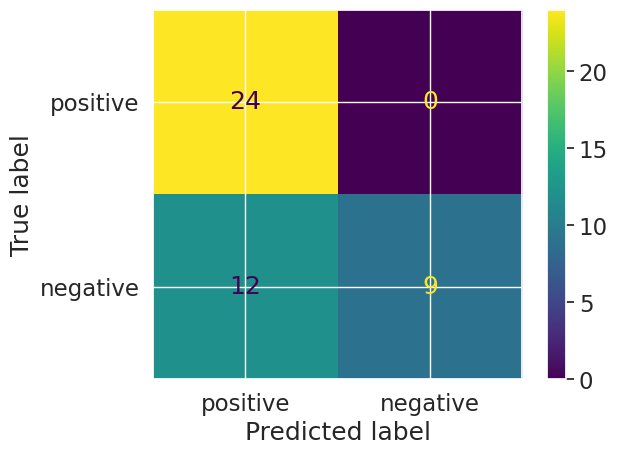

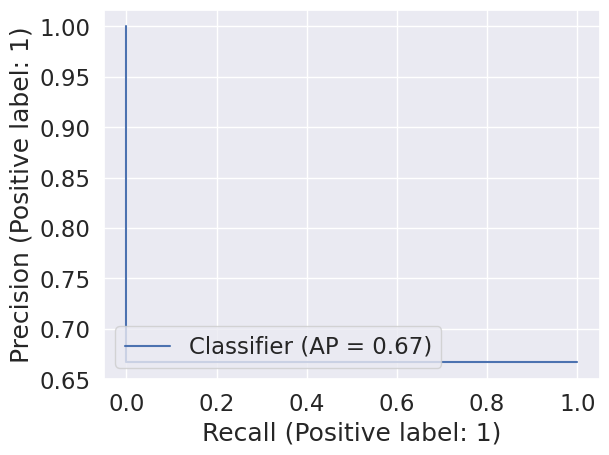

In [25]:
# use the parameters of the best classifier from the gridsearch and refit on data in CV manner 
import copy
# we should not change the gs instance
hits, y_pred = plot_report(copy.deepcopy(gs.best_estimator_), x_train, y_train, label=gs.best_params_,cv=5)
plt.show()

In [27]:
pats =df_strain_p2p.sort_values(['pat'])['pat'].unique()
wrong_pats = pats[~hits]
wrong_pats

IndexError: boolean index did not match indexed array along dimension 0; dimension is 57 but corresponding boolean dimension is 45

In [110]:
# show all wrong predicted patients and their number of positive segments followed by a binary list showing the positive/negative segments
print(df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['lge'].sum())
df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['dmd'].apply(list)

pat
aa_20180710    0.0
ab_20180710    0.0
ao_20191212    4.0
ej_20191126    4.0
gn_20190712    2.0
hj_20190206    0.0
hs_20180427    0.0
ou_20190507    2.0
Name: lge, dtype: float64


pat
aa_20180710    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
ab_20180710    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
ao_20191212    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
ej_20191126    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
gn_20190712    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
hj_20190206    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
hs_20180427    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
ou_20190507    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Name: dmd, dtype: object

In [56]:
df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)

(df_strain_p2p.groupby('pat')['lge'].sum()>2).values

array([False, False, False, False, False, False, False, False,  True,
        True, False, False,  True,  True,  True, False,  True, False,
        True, False,  True, False,  True,  True, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False,  True,  True, False, False,  True, False,  True,
        True,  True, False,  True,  True,  True, False, False, False,
        True, False, False,  True, False,  True,  True, False,  True,
        True, False,  True, False,  True, False, False,  True,  True,
        True, False, False, False, False,  True,  True, False, False,
        True, False, False,  True,  True, False,  True, False,  True,
        True, False, False,  True, False, False, False,  True,  True,
       False,  True, False,  True,  True,  True, False,  True, False,
       False,  True,  True,  True, False, False,  True,  True,  True,
       False, False,  True,  True, False, False, False,  True, False,
       False, False,

In [14]:
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

# Violinplots of RS/CS per patient - hue=LGE+/LGE-

In [43]:
df_strain_p2p[((df_strain_p2p['lge'] == 1) |  (df_strain_p2p['dmd'] == 0))]

(4230, 9)

all input arrays must have the same shape


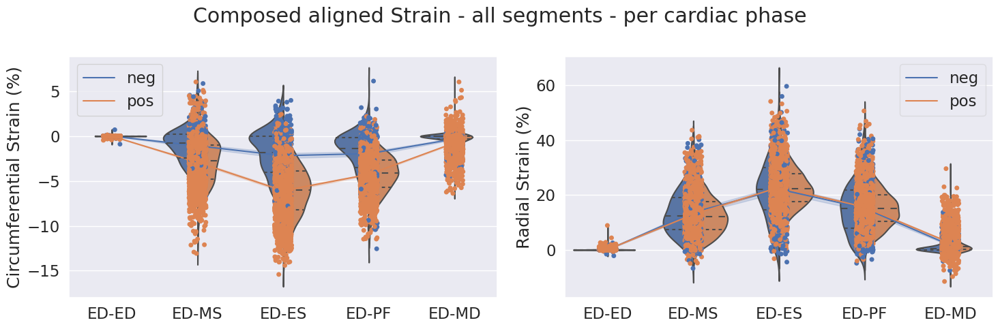

all input arrays must have the same shape


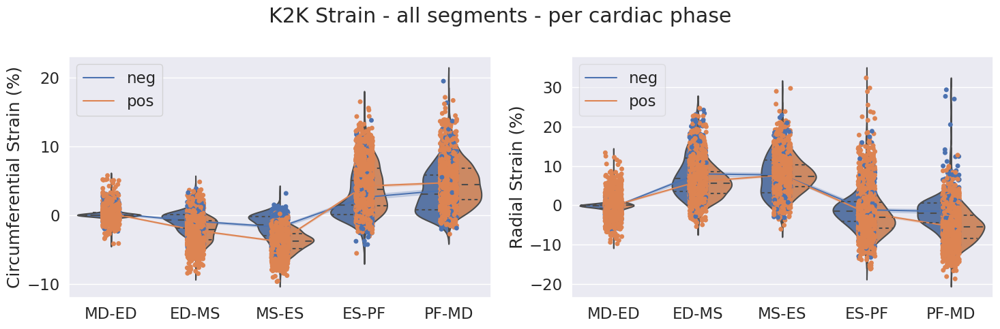

In [52]:
# compare control with LGE+ and with LGE-
target = 'dmd' # lge, lgeef, dmd, first_split
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp[((df_strain_comp['lge'] == 0) |  (df_strain_comp['dmd'] == 0))],title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p[((df_strain_p2p['lge'] == 0) |  (df_strain_p2p['dmd'] == 0))], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

In [144]:
# show significant differences between the first and the second split
target = 'first_split' # lge, lgeef, dmd, first_split
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp[df_strain_comp['lge']==1],title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p[df_strain_p2p['lge']==1], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

ValueError: Could not interpret value `first_split` for parameter `hue`

(16, 10)


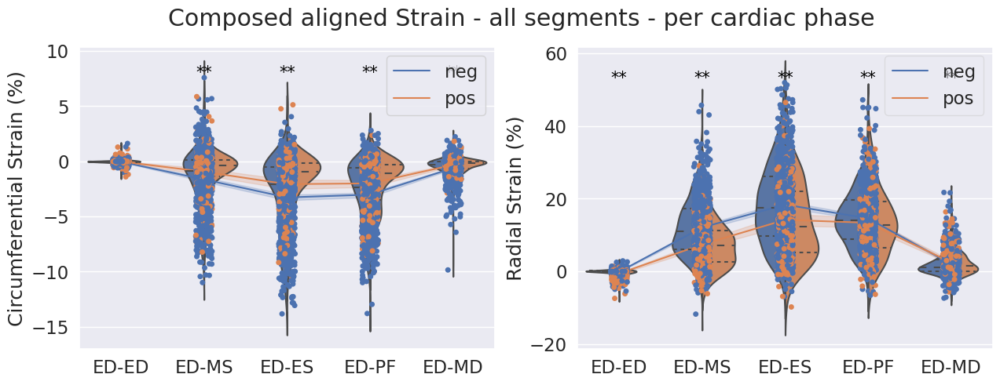

****************************************
RS strain in phase: ED-MS - significant AHA segments: [10], p-values: [0.02226]
aha  lge
10   0.0    7.776377
     1.0    7.885147
Name: our_rs, dtype: float64


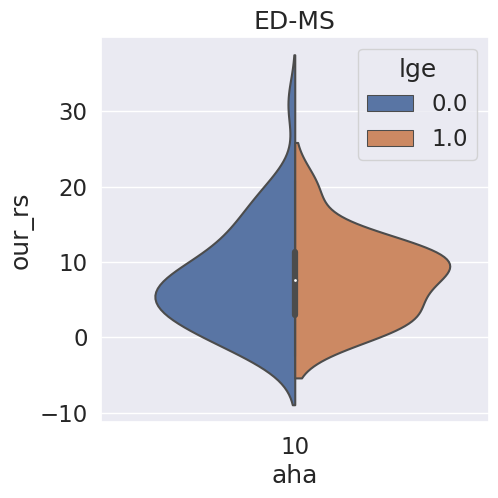

****************************************
CS strain in phase: ED-PF - significant AHA segments: [8], p-values: [0.0016]
aha  lge
8    0.0   -1.846195
     1.0   -0.333368
Name: our_cs, dtype: float64


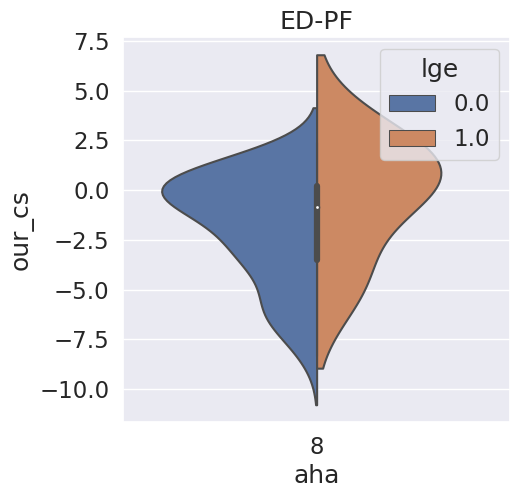

<Figure size 640x480 with 0 Axes>

(16, 10)


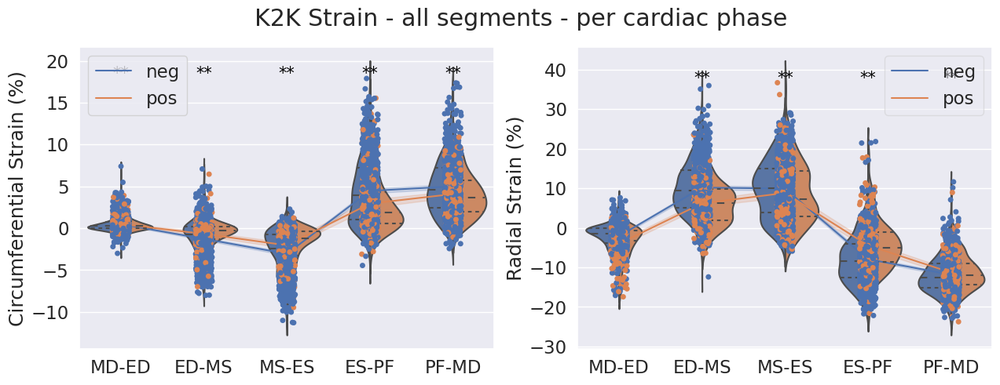

****************************************
RS strain in phase: ED-MS - significant AHA segments: [10], p-values: [0.01908]
aha  lge
10   0.0    6.629691
     1.0    7.055234
Name: our_rs, dtype: float64


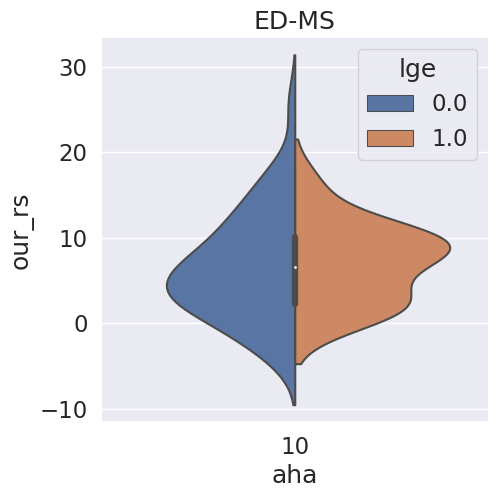

****************************************
CS strain in phase: ES-PF - significant AHA segments: [4, 5, 10, 11], p-values: [0.02054, 0.029830000000000002, 0.0064, 0.029830000000000002]
aha  lge
4    0.0    3.123838
     1.0    2.699353
5    0.0    5.417548
     1.0    1.875909
10   0.0    3.319139
     1.0    1.970209
11   0.0    6.318469
     1.0    2.183907
Name: our_cs, dtype: float64


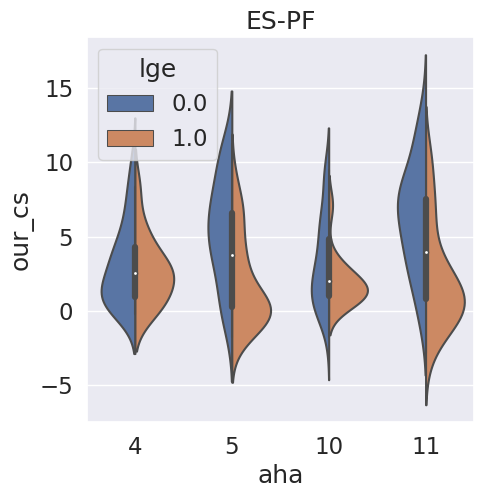

<Figure size 640x480 with 0 Axes>

In [3]:
target = 'lge' # lge, lgeef, dmd, first_split
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp,title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p, title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

# Bullseye plots

In [53]:
from src_julian.utils.myAHAfunctions import bullseye_plot, myBullsplot
import matplotlib as mpl
@interact_manual
def show_bullseye(pat=df_strain_p2p.pat.unique()):
    phases = df_strain_p2p.phase.unique()
    lges = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==0)].lge.values
    cmap_cs = mpl.cm.autumn
    cmap_rs = mpl.cm.autumn
    
    print('Patient: {}, positive segments: {}'.format(pat, np.where(lges)[0]))
    fig, axes = plt.subplots(4, len(phases), figsize=(20, 14), subplot_kw=dict(projection='polar'))
    q = .95
    q_lower = 1-q
    
    # normalise with an upper and lower quantile to exclude outliers to dominant the plot
    # k2k RS
    p2p_rs_data = df_strain_p2p[(df_strain_p2p.pat ==pat)].our_rs.values
    p2p_rs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_rs_data,q=q_lower), vmax=np.quantile(a=p2p_rs_data,q=q))
    #ax_p2p_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_p2p_rs, cmap=p2p_rs, norm=p2p_rs_norm, orientation='horizontal')
    # k2k CS
    p2p_cs_data = df_strain_p2p[(df_strain_p2p.pat ==pat)].our_cs.values
    p2p_cs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_cs_data,q=q_lower), vmax=np.quantile(a=p2p_cs_data,q=q))
    #ax_p2p_cs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_cs = mpl.colorbar.ColorbarBase(ax_p2p_cs, cmap=cmap_cs, norm=p2p_cs_norm, orientation='horizontal')

    # comp RS
    comp_rs_data = df_strain_comp[(df_strain_comp.pat ==pat)].our_rs.values
    comp_rs_norm = mpl.colors.Normalize( vmin=np.quantile(a=comp_rs_data,q=q_lower), vmax=np.quantile(a=comp_rs_data,q=q))
    #ax_comp_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_comp_rs, cmap=cmap_rs, norm=comp_rs_norm, orientation='horizontal')
    # comp CS
    comp_cs_data = df_strain_comp[(df_strain_comp.pat ==pat)].our_cs.values
    comp_cs_norm = mpl.colors.Normalize(vmin=np.quantile(a=comp_cs_data,q=q_lower), vmax=np.quantile(a=comp_cs_data,q=q))
    #ax_comp_cs = fig.add_axes([1, 0.55, .07, .02])
    #cb_rr = mpl.colorbar.ColorbarBase(ax_comp_cs, cmap=cmap_cs, norm=comp_cs_norm, orientation='horizontal')
    
    
    for p in phases:
        rs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_rs.values
        cs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_cs.values
        axes[0,p] = myBullsplot(data=rs, norm=p2p_rs_norm, lge=lges, ax=axes[0,p], cmap=cmap_rs)
        axes[1,p] = myBullsplot(data=cs, norm=p2p_cs_norm, lge=lges, ax=axes[1,p], cmap=cmap_cs)
        
        rs = df_strain_comp[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_rs.values
        cs = df_strain_comp[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_cs.values
        axes[2,p] = myBullsplot(data=rs, norm=comp_rs_norm, lge=lges, ax=axes[2,p], cmap=cmap_rs)
        axes[3,p] = myBullsplot(data=cs, norm=comp_cs_norm, lge=lges, ax=axes[3,p], cmap=cmap_cs)
    axes[0,0].set_title('Radial Strain - k2k')
    axes[1,0].set_title('Circumferential Strain - k2k')
    axes[2,0].set_title('Radial Strain - composed')
    
    axes[3,0].set_title('Circumverential Strain - composed')
    
    #axes[0,0].colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='horizontal')
    #plt.colorbar(cax=axes)
    plt.tight_layout()
    plt.show()

interactive(children=(Dropdown(description='pat', options=('aa_20180710', 'aa_20181211', 'ab_20180710', 'ac_20…

# Violinplots of RS/CS per segment - hue=LGE+/LGE-

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


y cannot be an empty list or array.


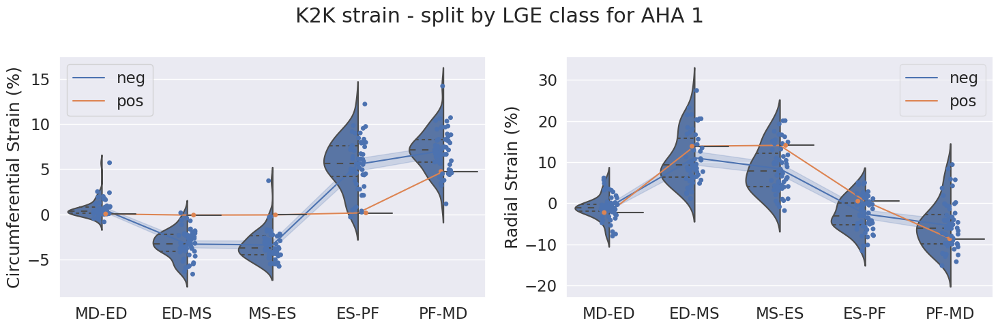

y cannot be an empty list or array.


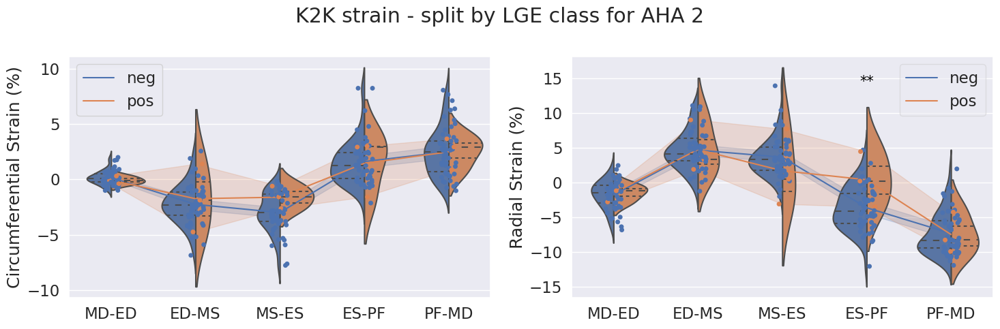

y cannot be an empty list or array.


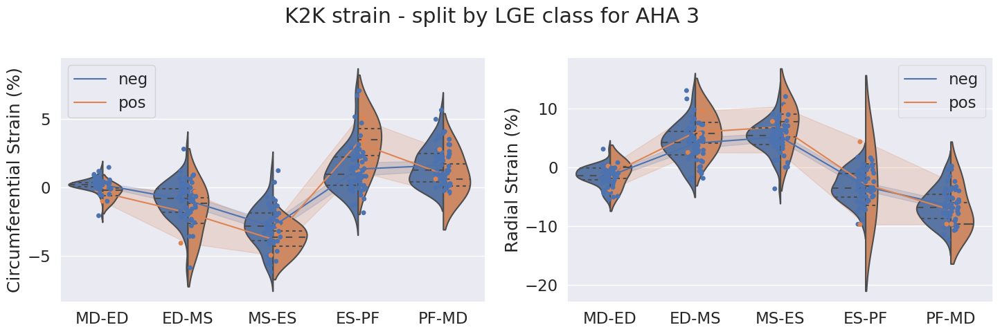

y cannot be an empty list or array.


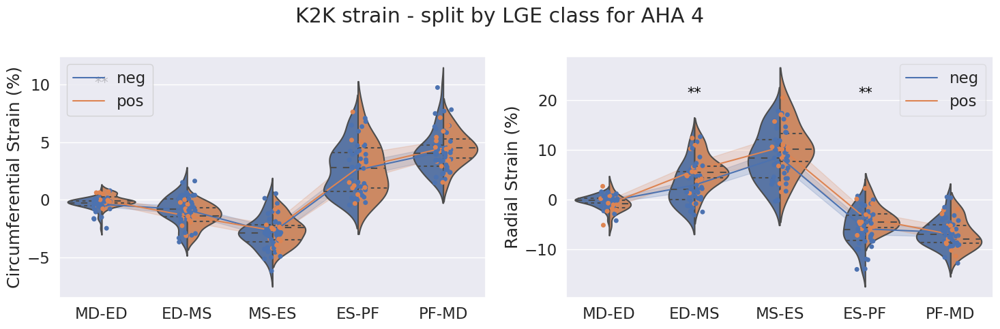

y cannot be an empty list or array.


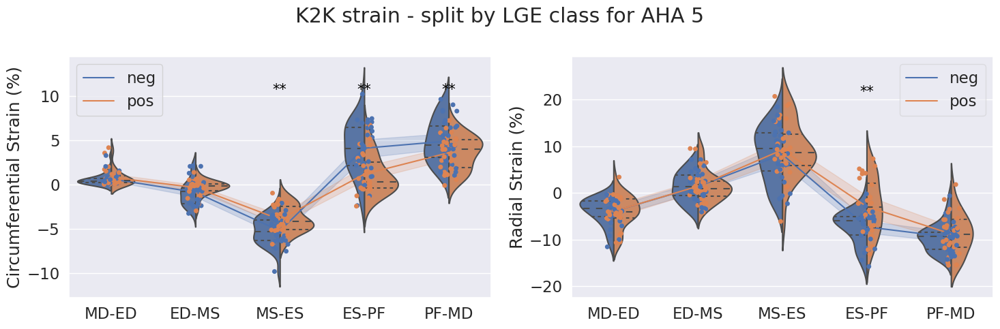

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

y cannot be an empty list or array.


/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

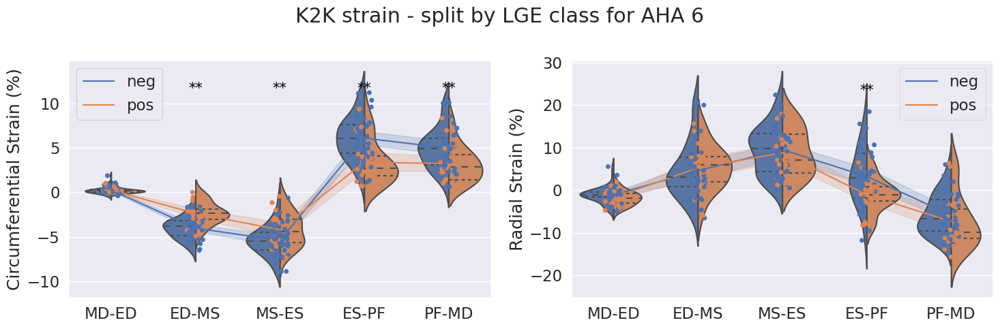

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

y cannot be an empty list or array.


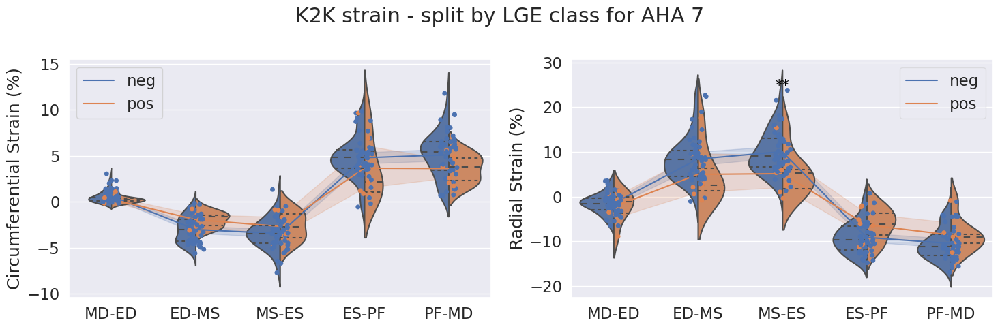

y cannot be an empty list or array.


/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

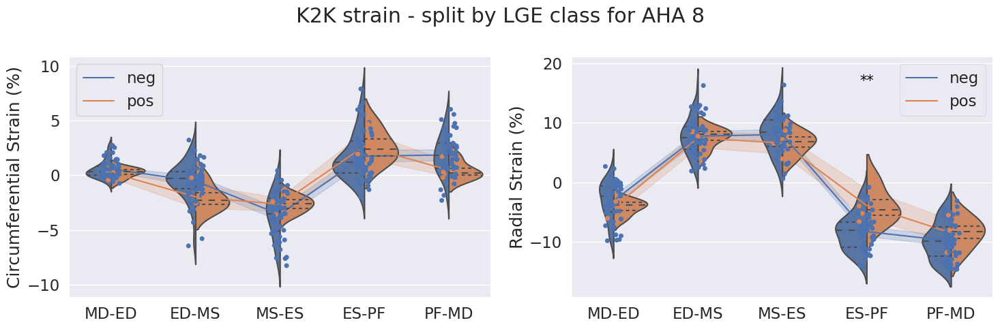

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

y cannot be an empty list or array.


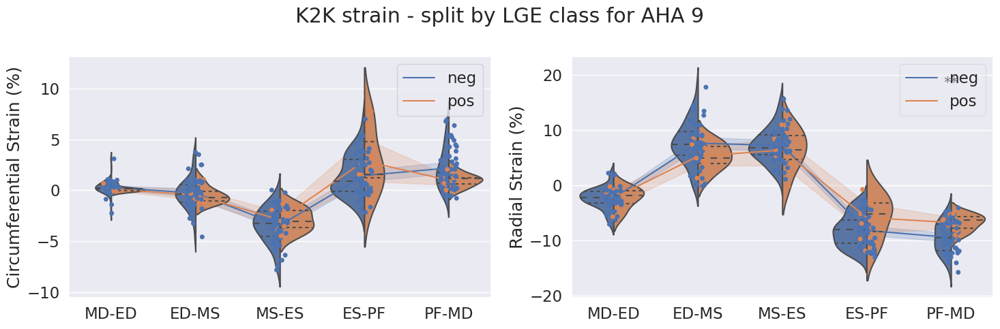

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

y cannot be an empty list or array.


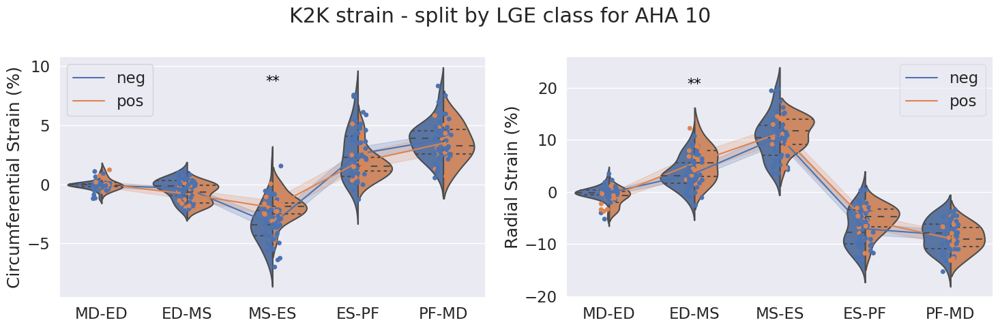

y cannot be an empty list or array.


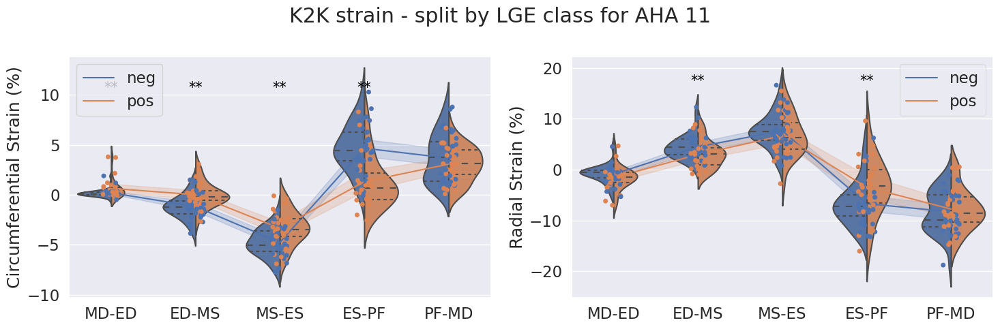

y cannot be an empty list or array.


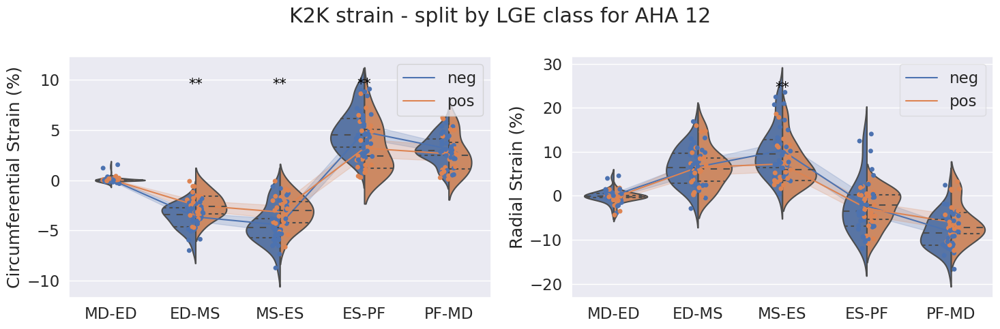

y cannot be an empty list or array.


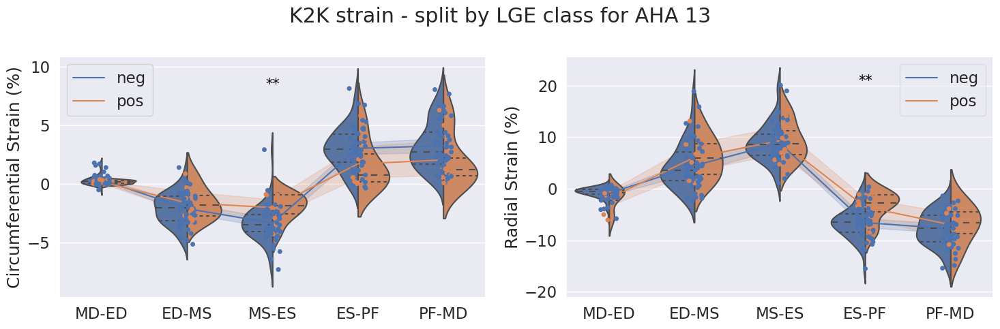

y cannot be an empty list or array.


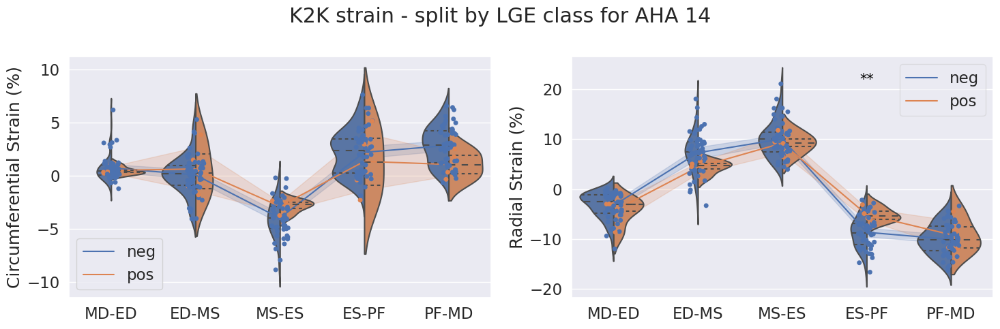

y cannot be an empty list or array.


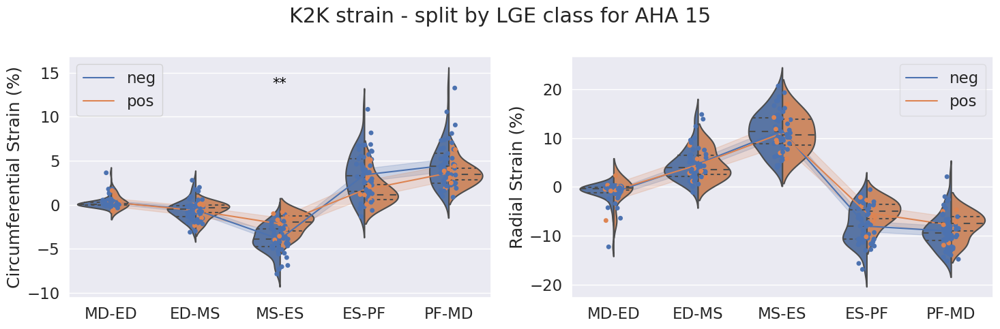

y cannot be an empty list or array.


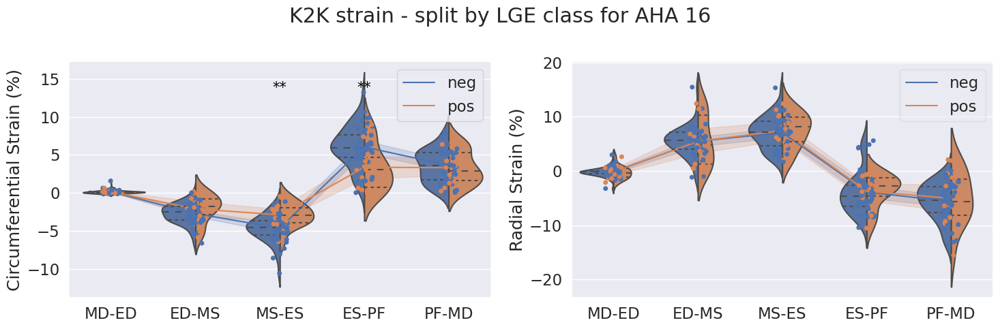

In [54]:
# plot one violinplot per mid-cavity segment for the p2p strains
segments_of_interest = list(range(1,17))
print(segments_of_interest)
for i in segments_of_interest:
    temp = df_strain_p2p[df_strain_p2p['aha']==i]
    _ = plot_strain_per_time(temp, title="K2K strain - split by LGE class for AHA {}".format(i), method='p2p');plt.show()

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


y cannot be an empty list or array.


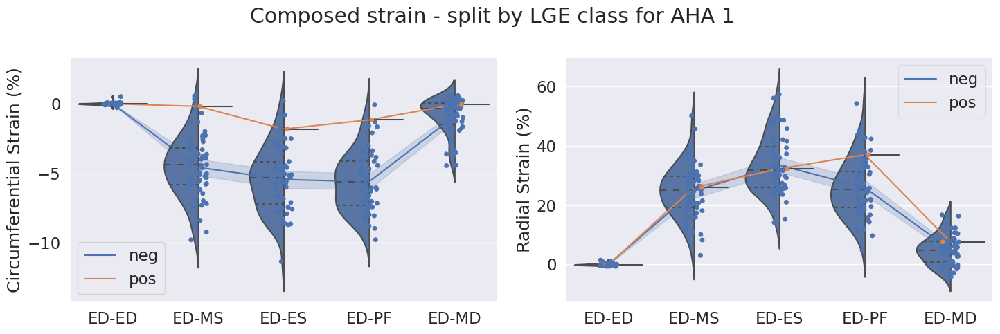

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


y cannot be an empty list or array.


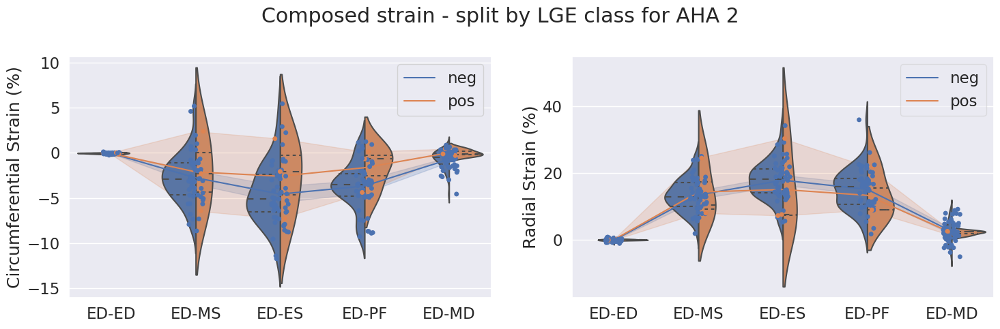

y cannot be an empty list or array.


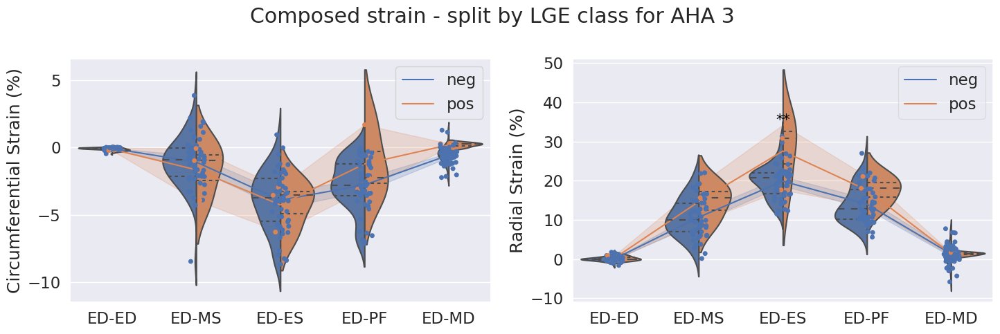

y cannot be an empty list or array.


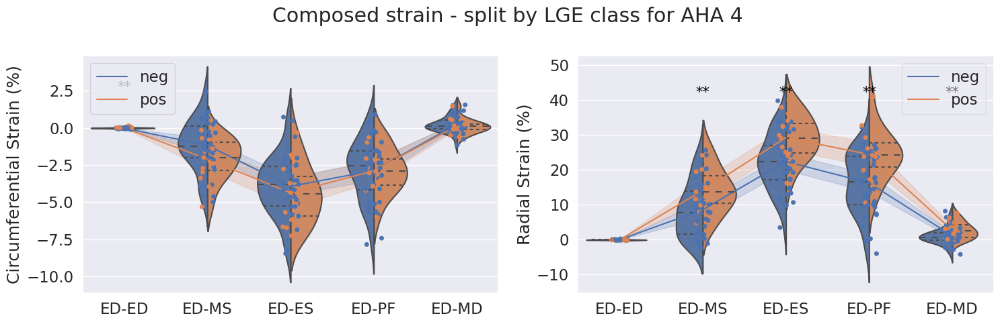

y cannot be an empty list or array.


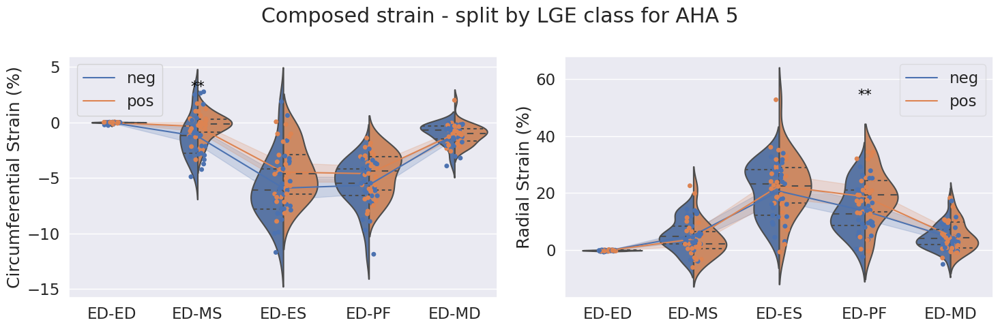

y cannot be an empty list or array.


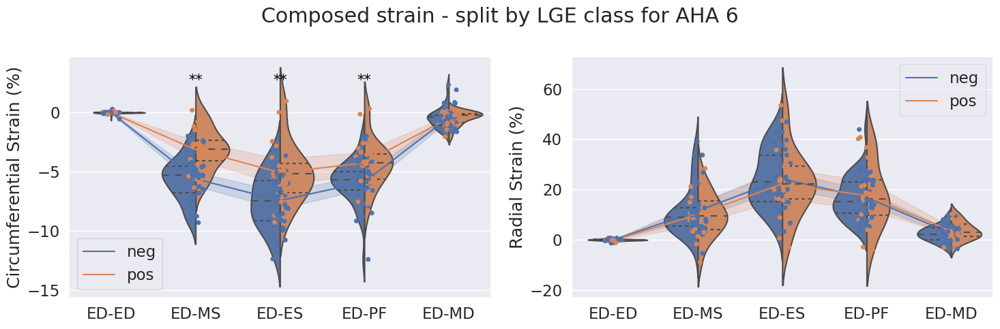

y cannot be an empty list or array.


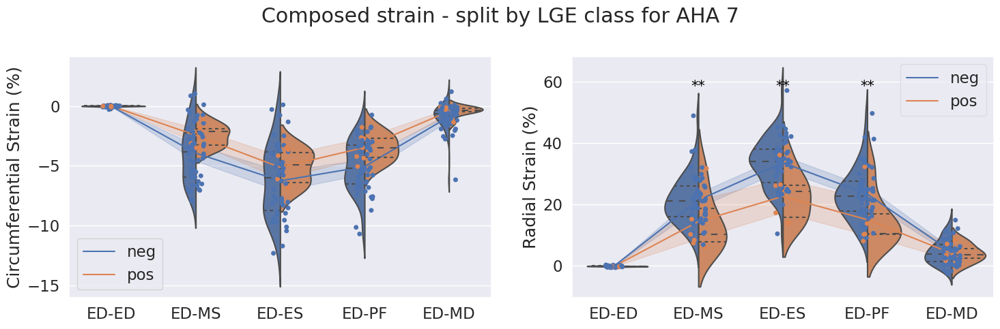

y cannot be an empty list or array.


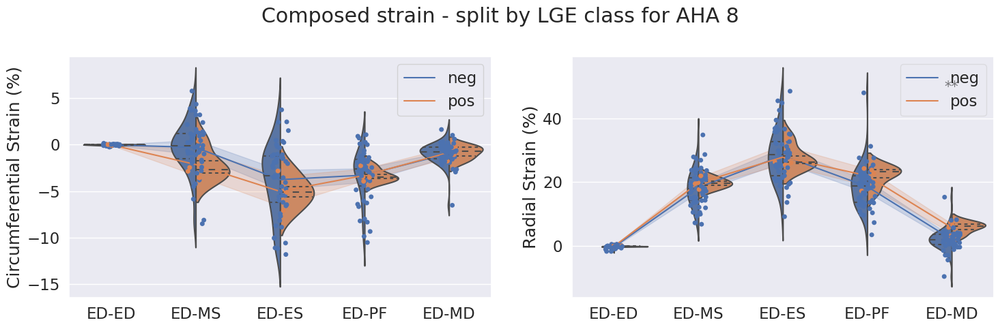

y cannot be an empty list or array.


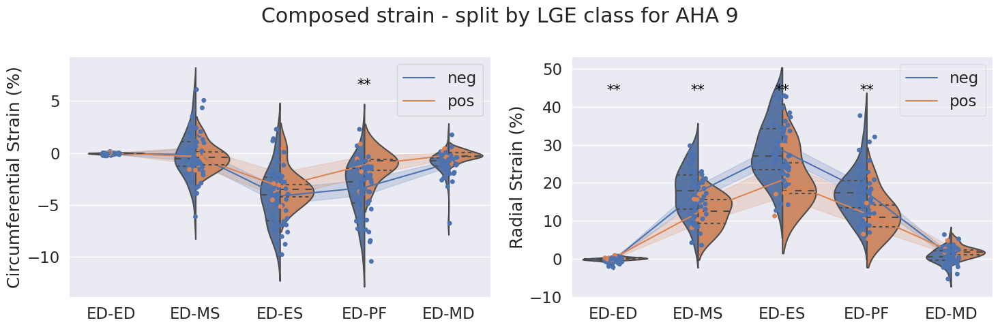

y cannot be an empty list or array.


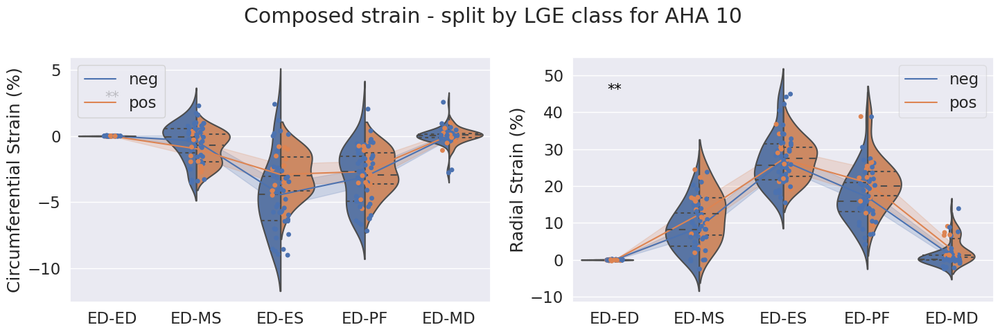

y cannot be an empty list or array.


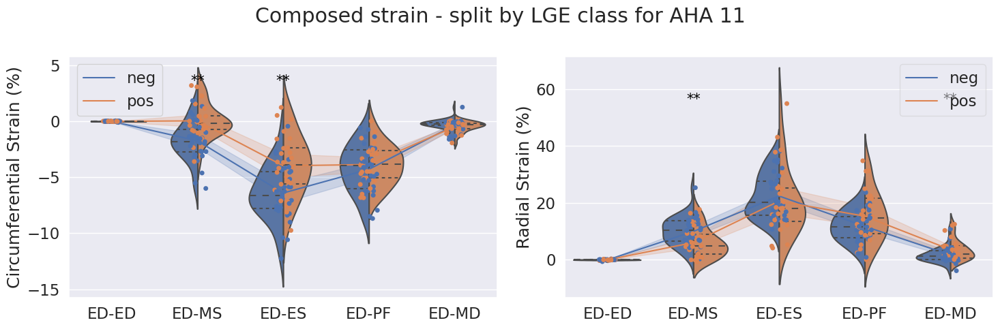

y cannot be an empty list or array.


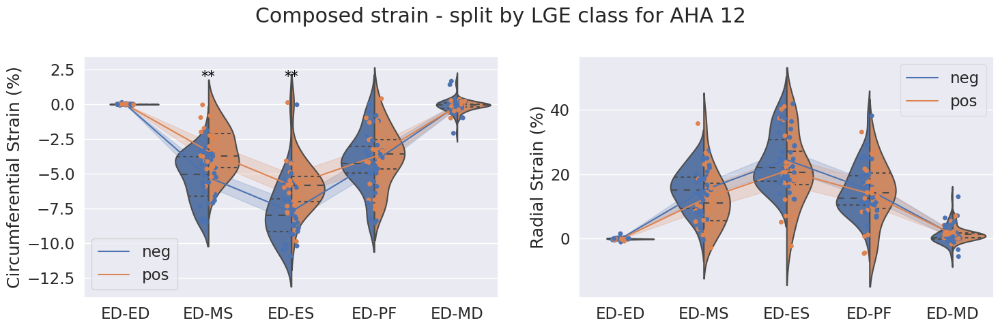

y cannot be an empty list or array.


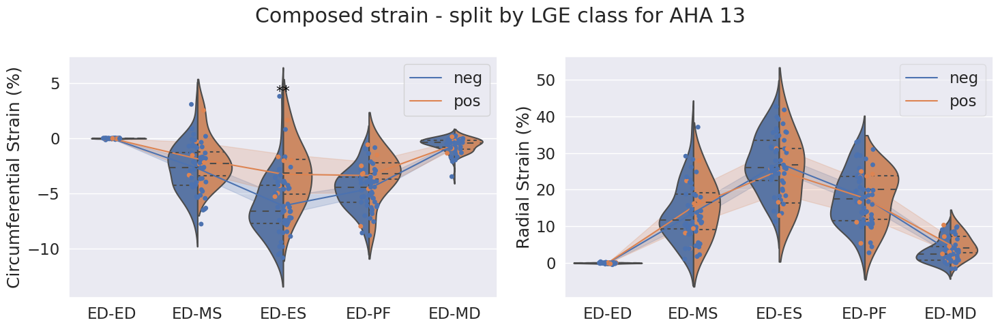

y cannot be an empty list or array.


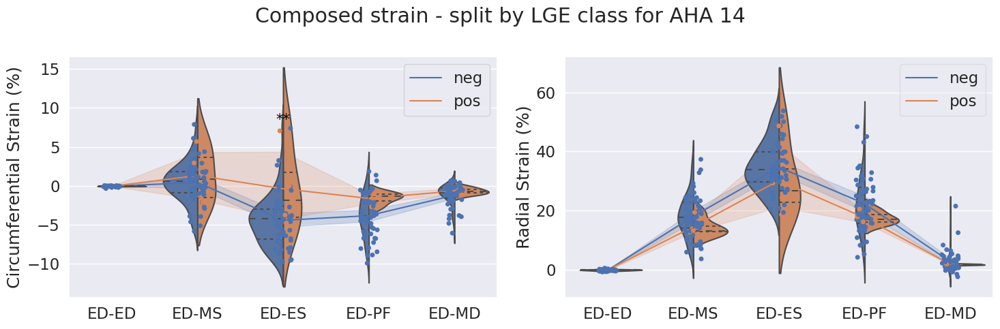

y cannot be an empty list or array.


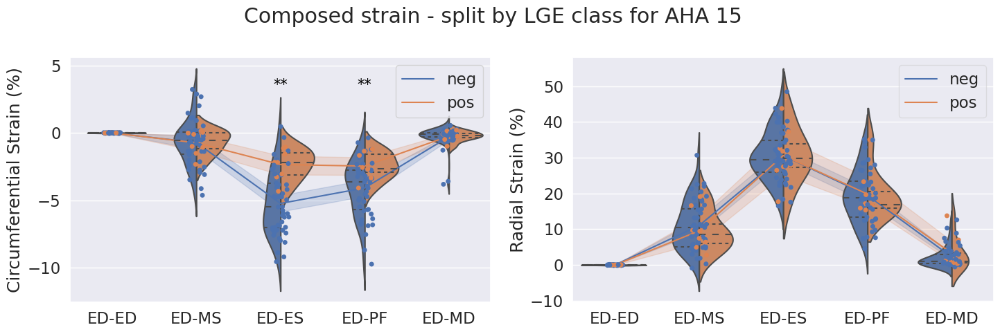

y cannot be an empty list or array.


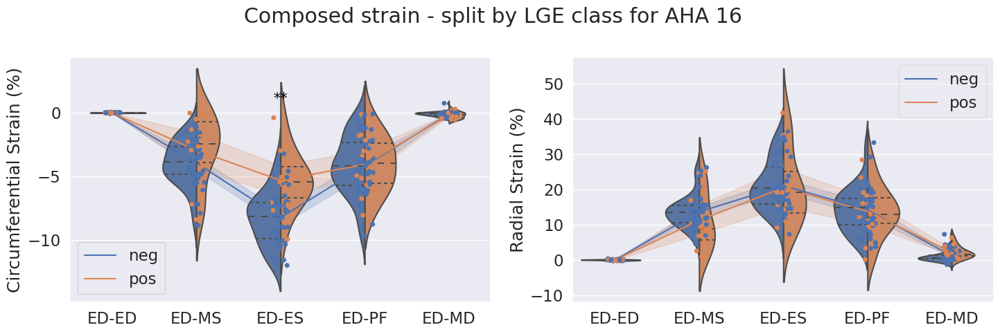

In [55]:
# plot one violinplot per mid-cavity segment for the comp strains
for i in segments_of_interest:
    temp = df_strain_comp[df_strain_comp['aha']==i]
    _ = plot_strain_per_time(temp, title="Composed strain - split by LGE class for AHA {}".format(i), method='comp');plt.show()

In [24]:
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp = df_strain_p2p_positive.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_pos.xlsx'))

In [25]:
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp = df_strain_p2p_negative.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_neg.xlsx'))

In [26]:
# Calc the mean/std for the phase2phases strain per patient, export as xlsx
temp = df_strain_p2p.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_mean.xlsx'))

In [27]:
# Calc the mean/std for the composed strain per patient, export as xlsx
temp = df_strain_comp.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_comp.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_comp_mean.xlsx'))

In [10]:
temp

our_rs_mean  our_cs_mean  our_rs_std  our_cs_std
aha phase                                                  
1   0         0.879806     0.089290    0.398987    0.068014
    1         1.075437     0.148970    0.605217    0.093149
    2         0.658606     0.071887    0.321721    0.048374
    3         0.111531     0.001926    0.081021    0.012156
    4         0.003178     0.004315    0.009424    0.006549
...                ...          ...         ...         ...
16  0         0.272984     0.000857    0.181541    0.032843
    1         0.709379    -0.005076    0.257008    0.040408
    2         0.287029    -0.015934    0.230191    0.030687
    3         0.018638    -0.003388    0.015524    0.005383
    4        -0.004293     0.005913    0.008082    0.012554

[80 rows x 4 columns]

In [17]:
# test, if we use only the mid-cavity segments, this performs better, than taking all segments into account
# only freewall
segments_of_interest = [4,5,6,11,12]
# only mid-cavity
segments_of_interest =[5,6,7,8,9,10,11,12]
df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments_of_interest)]
df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments_of_interest)]

In [55]:
df_strain_comp.head()

,pat,aha,phase,our_rs,our_cs,soa,lge
20,aa_20180710,5,0,0.003685,0.051645,0.0,0.0
21,aa_20180710,5,1,0.913108,0.121693,0.0,0.0
22,aa_20180710,5,2,0.261745,0.014910,0.0,0.0
23,aa_20180710,5,3,0.013298,-0.003892,0.0,0.0
24,aa_20180710,5,4,-0.015184,0.001413,0.0,0.0


# Visualise the vector fields

In [6]:
def plotff(ff, t, z_abs, N):
    nx, ny = (ff.shape[3], ff.shape[2])
    X, Y = np.mgrid[0:nx, 0:ny]
    X, Y = (X[::N, ::N], Y[::N, ::N])
    U = ff[t, z_abs, ::N, ::N, 2]  # x
    V = ff[t, z_abs, ::N, ::N, 1]
    return X, Y, U, V

def plot_1x5_quiver_flowfield(ff, mask_lvmyo=None, cmrs=None, z_abs=None, N=1, crop=None, style=None, headwidth=2.5, headlength=3, width=1, scale=0.5):
    xmin, xmax, ymin, ymax = (crop[0], crop[1], crop[2], crop[3])
    nt = ff.shape[0]

    if style == 'p2p':
        xlabels = ['MD-ED', 'ED-MS', 'MS-ES', 'ES-PF', 'PF-MD']
    elif style == 'comp':
        xlabels = ['ED-ED', 'ED-MS', 'ED-ES', 'ED-PF', 'ED-MD']


    fig, ax = plt.subplots(1, nt, figsize=(12, 10))
    
    for t in range(nt):
        
        X, Y, U, V = plotff(ff=ff, t=t, z_abs=z_abs, N=N)
        ax[t].quiver(Y, X, U, V, units='xy', angles='xy', scale=scale, color='black', headwidth=headwidth,
                     headlength=headlength, width=width)
        
        if mask_lvmyo is not None:
            if style == 'p2p':
                ax[t].imshow(mask_lvmyo[t, z_abs, ..., 0], cmap='Wistia')
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
                
            elif style == 'comp':
                ax[t].imshow(mask_lvmyo[0, z_abs, ..., 0], cmap='Wistia') # only plot ED mask
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
        
        ax[t].set_title(xlabels[t], fontsize=20)
        ax[t].set_xlim(xmin, xmax)
        ax[t].set_ylim(ymax, ymin)
        ax[t].set_aspect('equal')
    plt.setp(ax, xticks=[], yticks=[])
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
import glob
import SimpleITK as sitk
patients = sorted(glob.glob(os.path.join(path_chooser.selected, 'pred/*/')))
@interact_manual
def show_quiever(i=(0,len(patients)), z=(0,32), scale=0.5, N=3, do_mask=False):

    global msks
    pat = patients[i]

    #ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_*")) if "flow_0" in f or "flow_1" in f or "flow_2" in f or "flow_3" in f or "flow_4" in f])
    ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_masked*"))])
    ffs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs], axis=-1)
    ffs = np.einsum('cxyzt->tzyxc', ffs)
    
    ffs_comp = sorted([ f for f in glob.glob(os.path.join(pat, "flow_composed*"))])
    ffs_comp = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs_comp], axis=-1)
    ffs_comp = np.einsum('cxyzt->tzyxc', ffs_comp)
    

    msks = sorted(glob.glob(os.path.join(pat, "myo_target*")))
    msks = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in msks], axis=-1)
    msks = np.einsum('xyzt->tzyx', msks)[...,None]
    
    cmrs = sorted(glob.glob(os.path.join(pat, "cmr_moving*")))
    cmrs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in cmrs], axis=-1)
    cmrs = np.einsum('xyzt->tzyx', cmrs)[...,None]
    
    if do_mask: ffs_comp[np.broadcast_to(msks[1:2]<0.1,shape=ffs_comp.shape)] = 0
    if do_mask: ffs[np.broadcast_to(msks<0.1,shape=ffs.shape)] = 0 # np.roll(msks<0.1, shift=1)
    print(pat.split('/')[-2])
    print('composed')
    plot_1x5_quiver_flowfield(ff=ffs_comp,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,96,0,96], style='comp', N=N, scale=scale)
    print('k2k')
    plot_1x5_quiver_flowfield(ff=ffs,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,96,0,96], style='p2p', N=N, scale=scale)

interactive(children=(IntSlider(value=28, description='i', max=57), IntSlider(value=16, description='z', max=3…

In [364]:
# simple test with a classification model
from xgboost import XGBClassifier

# Inference case for the ML model (fit on 57, inference on 81 and vize versa)

In [83]:
'''# manual splitting of two datasets, this should be no longer neccessary
# as we split the data in step 4.
clf = gs.best_estimator_
label = gs.best_params_
# load process first split
x_train, y_train = x,y
# load process second split
x_test, y_test = x,y
# fit a new estimator with the 'best parameters'
clf = clf.set_params(**label)
clf.fit(x_train, y_train)
pred_train = clf.predict(x_train)
pred_test = clf.predict(x_test)
print('len train:',len(pred_train))
print('len test:', len(pred_test))
'''

In [26]:
# the gs instance is refit on all trainings files with the refit parameter according to the balance accuracy
# now we can use the gs instance as estimator
pred_train = gs.predict(x_train)
pred_test = gs.predict(x_test)
print('len train:',len(pred_train))
print('len test:', len(pred_test))


len train: 45
len test: 12


In [27]:
from src.utils.Evaluation import my_sens, my_spec, bacc_m
from sklearn.metrics import balanced_accuracy_score
spec_train = my_spec(y_train, pred_train)
sens_train = my_sens(y_train, pred_train)
acc_train = balanced_accuracy_score(y_train, pred_train)
spec_test = my_spec(y_test, pred_test)
sens_test = my_sens(y_test, pred_test)
acc_test = balanced_accuracy_score(y_test, pred_test)


In [28]:
print(gs.best_estimator_)
print(gs.best_params_)
print('train sens:',sens_train, 'train spec:',spec_train, 'train acc:', acc_train)
print('test sens:',sens_test,'test spec:',spec_test, 'test acc:', acc_test)

Pipeline(steps=[('scaler', None),
                ('clf',
                 SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'))])
{'clf': SVC(C=0.1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}
train sens: 1.0 train spec: 0.47619047619047616 train acc: 0.7380952380952381
test sens: 1.0 test spec: 0.2 test acc: 0.6


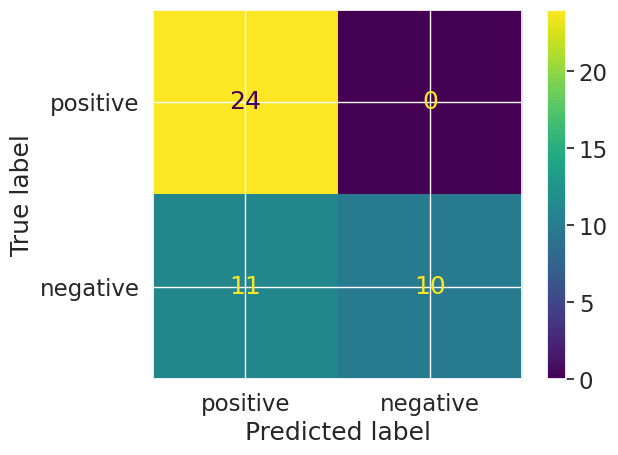

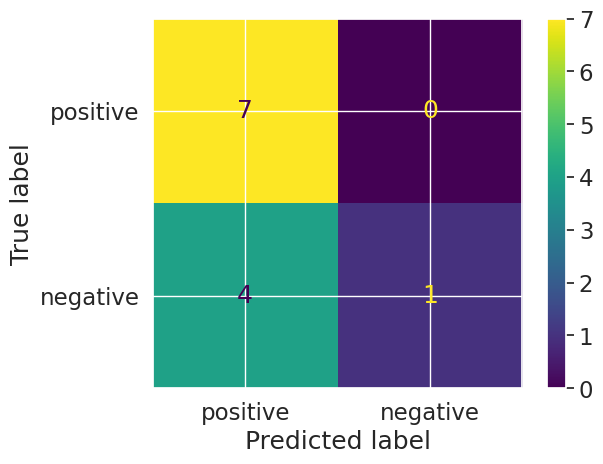

In [29]:
# visualise train and test confusion matrix
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay.from_predictions(y_train, pred_train, labels=[1, 0], display_labels=['positive', 'negative'],
                                                   colorbar=True)
disp = ConfusionMatrixDisplay.from_predictions(y_test, pred_test, labels=[1, 0], display_labels=['positive', 'negative'],
                                                   colorbar=True)
plt.show()

# Examples of dataframe grouby

In [28]:
temp_y = np.stack(df_strain_comp.groupby(['phase'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(5, 1296)
LGE positive patients:  226
LGE negative patients:  1070


In [29]:
temp_y = np.stack(df_strain_comp.groupby(['phase','aha'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(80, 81)
LGE positive patients:  45
LGE negative patients:  36


In [30]:
# best groupby selection for patient and segment based target y
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 80)
LGE positive segments:  1130
LGE negative segments:  5350
LGE positive patients:  45
LGE negative patients:  36


In [31]:
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 16)
LGE positive patients:  45
LGE negative patients:  36


# Peak Strain via argmax or static phase slicing

Phases: [0:4] --> ED,MS,ES,PF,MD
Usually min(cs) and max(rs) should reflect the phase MS--> ES, which sould be phase==1

In [12]:
# for a patient based pos/neg splitting we need a list of patients with LGE pos and LGE neg
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
pat_pos = df_strain_comp.pat.unique()[temp_y_patients==True]
pat_neg = df_strain_comp.pat.unique()[temp_y_patients==False]
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 80)
LGE positive segments:  1305
LGE negative segments:  5175
LGE positive patients:  47
LGE negative patients:  34


In [13]:
# peak strain values per LGE positive group
pd.set_option('display.float_format', lambda x: '%.4f' % x)
df_peak_positive = df_peak[df_peak['pat'].isin(pat_pos)] * 100
df_peak_positive.describe()

,aha,soa,lge,lgeef,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000,752.0000
mean,850.0000,0.0000,34.7074,24.0691,100.0000,12.7261,-2.8485,23.4539,-6.2627,6.4021,-2.2112,9.6726,-3.9702
std,461.2840,0.0000,47.6357,42.7788,0.0000,7.6327,2.8025,8.4933,2.7919,4.6397,2.0072,4.7329,1.5505
min,100.0000,0.0000,0.0000,0.0000,100.0000,-5.7466,-11.7078,0.0718,-14.6034,-4.8901,-7.8935,-1.1965,-9.7126
25%,475.0000,0.0000,0.0000,0.0000,100.0000,7.2703,-4.7601,17.5838,-8.0985,3.2297,-3.6142,6.4245,-4.9525
50%,850.0000,0.0000,0.0000,0.0000,100.0000,12.0217,-2.7929,23.2094,-6.1616,6.0472,-2.2045,9.0059,-3.9269
75%,1225.0000,0.0000,100.0000,0.0000,100.0000,17.3969,-0.9034,28.8243,-4.2138,9.0602,-0.7402,12.5602,-2.8632
max,1600.0000,0.0000,100.0000,100.0000,100.0000,41.2035,6.4259,58.2974,-0.0305,21.1491,3.7914,30.8095,-0.1384


In [14]:
# peak strain values per LGE negative group
df_peak_negative = df_peak[df_peak['pat'].isin(pat_neg)] * 100
df_peak_negative.describe()

,aha,soa,lge,lgeef,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000,544.0000
mean,850.0000,0.0000,0.0000,0.0000,100.0000,12.9077,-3.0498,23.7873,-6.9365,6.3754,-2.3076,9.2892,-4.4409
std,461.4015,0.0000,0.0000,0.0000,0.0000,7.1224,3.1373,8.2889,3.1726,4.3317,2.2267,4.5709,1.6732
min,100.0000,0.0000,0.0000,0.0000,100.0000,-5.8976,-12.8574,2.0459,-15.2499,-5.7086,-8.7067,-0.4659,-8.9853
25%,475.0000,0.0000,0.0000,0.0000,100.0000,7.8763,-5.0365,18.5420,-9.2756,3.5686,-3.7242,6.1216,-5.6157
50%,850.0000,0.0000,0.0000,0.0000,100.0000,12.4835,-2.9185,22.7367,-6.7193,6.0329,-2.2899,8.6299,-4.3602
75%,1225.0000,0.0000,0.0000,0.0000,100.0000,17.0801,-0.7498,28.2017,-4.6078,9.0197,-0.7777,11.7506,-3.2432
max,1600.0000,0.0000,0.0000,0.0000,100.0000,52.0563,6.4893,77.7124,-0.4406,31.8594,5.0042,31.8594,-0.4051


In [15]:
df_p2p_pos = df_strain_p2p[df_strain_p2p['pat'].isin(pat_pos)] * 100
df_p2p_pos.describe()

,aha,phase,our_rs,our_cs,soa,lge,lgeef,dmd
count,3760.0000,3760.0000,3760.0000,3760.0000,3760.0000,3760.0000,3760.0000,3760.0000
mean,850.0000,200.0000,1.9475,0.5426,0.0000,34.7074,24.0691,100.0000
std,461.0385,141.4402,6.4715,4.0555,0.0000,47.6103,42.7560,0.0000
min,100.0000,0.0000,-15.3881,-9.7126,0.0000,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-2.2703,-2.4371,0.0000,0.0000,0.0000,100.0000
50%,850.0000,200.0000,0.8577,-0.0004,0.0000,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,6.2770,2.7125,0.0000,100.0000,0.0000,100.0000
max,1600.0000,400.0000,30.8095,15.8761,0.0000,100.0000,100.0000,100.0000


In [16]:
df_p2p_neg = df_strain_p2p[df_strain_p2p['pat'].isin(pat_neg)] * 100
df_p2p_neg.describe()

,aha,phase,our_rs,our_cs,soa,lge,lgeef,dmd
count,2720.0000,2720.0000,2720.0000,2720.0000,2720.0000,2720.0000,2720.0000,2720.0000
mean,850.0000,200.0000,1.8051,0.6796,0.0000,0.0000,0.0000,100.0000
std,461.0620,141.4474,6.4100,4.4853,0.0000,0.0000,0.0000,0.0000
min,100.0000,0.0000,-15.5267,-8.9853,0.0000,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-2.5237,-2.7111,0.0000,0.0000,0.0000,100.0000
50%,850.0000,200.0000,1.0230,0.0036,0.0000,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,6.1163,3.5535,0.0000,0.0000,0.0000,100.0000
max,1600.0000,400.0000,31.8594,15.2838,0.0000,0.0000,0.0000,100.0000


In [18]:
# does the strain values come from two different distributions
from scipy import stats

@interact
def p_test(col = df_p2p_neg.columns, p = df_p2p_neg.phase.unique()):
    try:
        print(df_p2p_neg[col].shape)
        df_temp_neg = df_p2p_neg[df_p2p_neg['phase'].isin([p])]
        df_temp_pos = df_p2p_pos[df_p2p_pos['phase'].isin([p])]
        return stats.ttest_ind(df_temp_neg[col], df_temp_pos[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', '…

In [352]:
# does the strain values come from two different distributions
from scipy import stats
# [c for c in df_peak_negative.columns if 'p2p' in c]
@interact
def p_test(col = df_peak_negative.columns):
    try:
        print(df_peak_negative[col].shape)
        return stats.ttest_ind(df_peak_negative[col], df_peak_positive[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'soa', 'lge', 'dmd', 'prs_com_p', 'pc…

In [353]:
# segment and phase with the maximal difference between LGE pos and negative group
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp_pos = df_strain_p2p_positive.groupby(['aha','phase']).mean()

df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp_neg = df_strain_p2p_negative.groupby(['aha','phase']).mean()

diff = abs(temp_pos - temp_neg)*100
diff[['our_rs', 'our_cs']]

our_rs  our_cs
aha phase                
1   0      0.6969  0.7379
    1      4.2738  1.6631
    2      0.6351  0.6560
    3      3.2295  4.2233
    4      2.1223  1.7816
...           ...     ...
16  0      0.1133  0.1915
    1      0.9443  0.7701
    2      0.1825  1.4019
    3      2.3209  2.1994
    4      1.4234  3.0680

[80 rows x 2 columns]

******************** strain composed ********************
prs: Counter({2: 1026, 3: 266, 1: 4})
pcs: Counter({2: 867, 3: 413, 1: 8, 4: 6, 0: 2})


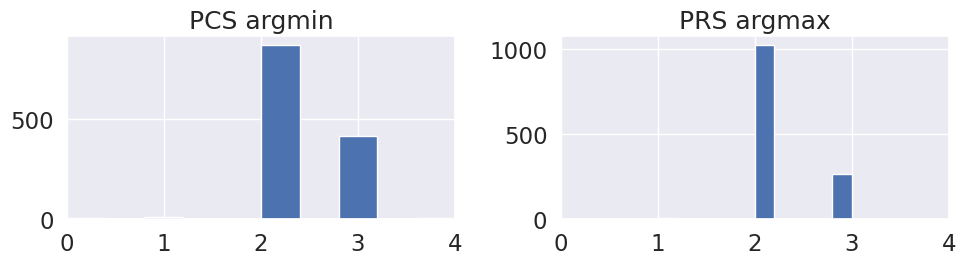

******************** strain p2p ********************
prs: Counter({2: 778, 1: 459, 3: 36, 4: 19, 0: 4})
pcs: Counter({2: 1116, 1: 161, 3: 16, 4: 3})


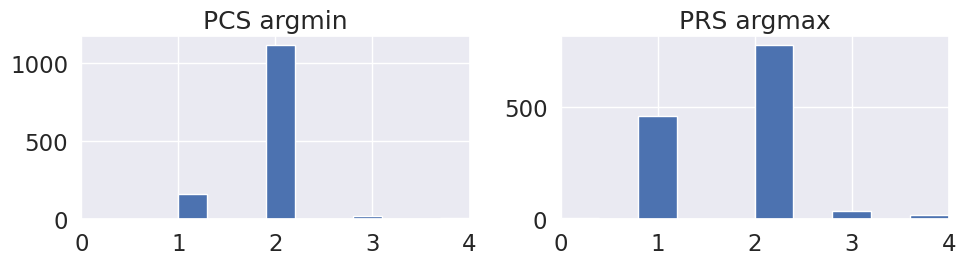

In [25]:
def show_phase_with_max_min_strain(df):
    from collections import Counter
    fig, ax = plt.subplots(1,2,figsize=(10,3))
    # peak radial strain
    rs = np.stack(df.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32)
    # peak circumferential strain
    cs = np.stack(df.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)

    prs_argmax = np.argmax(rs, axis=1)
    pcs_argmin = np.argmin(cs, axis=1)
    print('prs: {}'.format(Counter(prs_argmax)))
    print('pcs: {}'.format(Counter(pcs_argmin)))

    # plot
    ax[0].hist(pcs_argmin)
    ax[0].set_title('PCS argmin')
    ax[0].set_xlim(0,4)
    ax[1].hist(prs_argmax)
    ax[1].set_title('PRS argmax')
    ax[1].set_xlim(0,4)
    plt.tight_layout()
    plt.show()
    
print('*'*20,'strain composed','*'*20)
show_phase_with_max_min_strain(df_strain_comp)
print('*'*20,'strain p2p','*'*20)
show_phase_with_max_min_strain(df_strain_p2p)

******************** strain composed lge pos ********************
prs: Counter({2: 147, 3: 79})
pcs: Counter({2: 123, 3: 100, 4: 2, 1: 1})


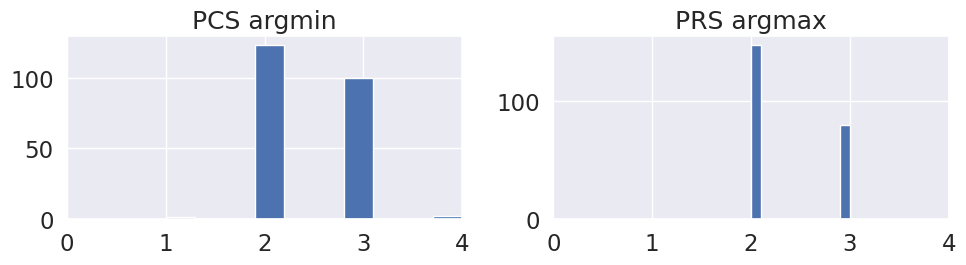

******************** strain composed lge neg ********************
prs: Counter({2: 879, 3: 187, 1: 4})
pcs: Counter({2: 744, 3: 313, 1: 7, 4: 4, 0: 2})


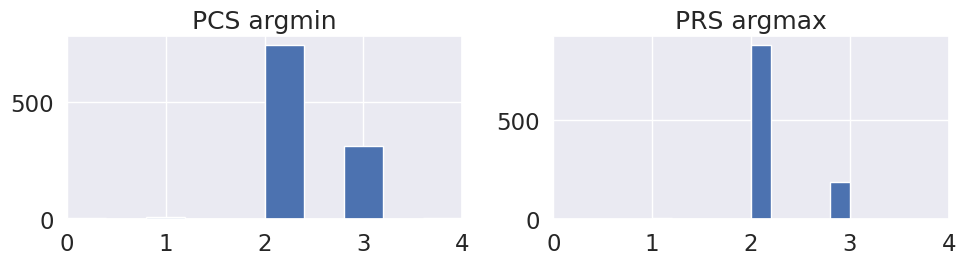

******************** strain p2p lge pos ********************
prs: Counter({2: 144, 1: 60, 3: 19, 4: 3})
pcs: Counter({2: 195, 1: 22, 3: 7, 4: 2})


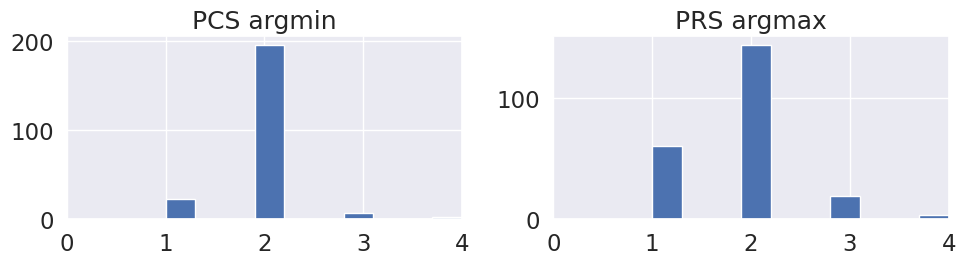

******************** strain p2p lge neg ********************
prs: Counter({2: 634, 1: 399, 3: 17, 4: 16, 0: 4})
pcs: Counter({2: 921, 1: 139, 3: 9, 4: 1})


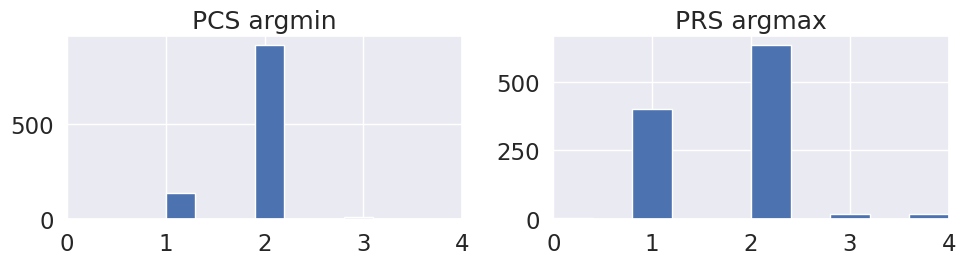

In [27]:
# occurence of the peak and min values per outcome group and strain
df_strain_comp_positive = df_strain_comp[df_strain_comp['lge']==1]
df_strain_comp_negative = df_strain_comp[df_strain_comp['lge']==0]
print('*'*20,'strain composed lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_comp_positive)
print('*'*20,'strain composed lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_comp_negative)

df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
print('*'*20,'strain p2p lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_positive)
print('*'*20,'strain p2p lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_negative)

# Pairplot

## Composed Strain

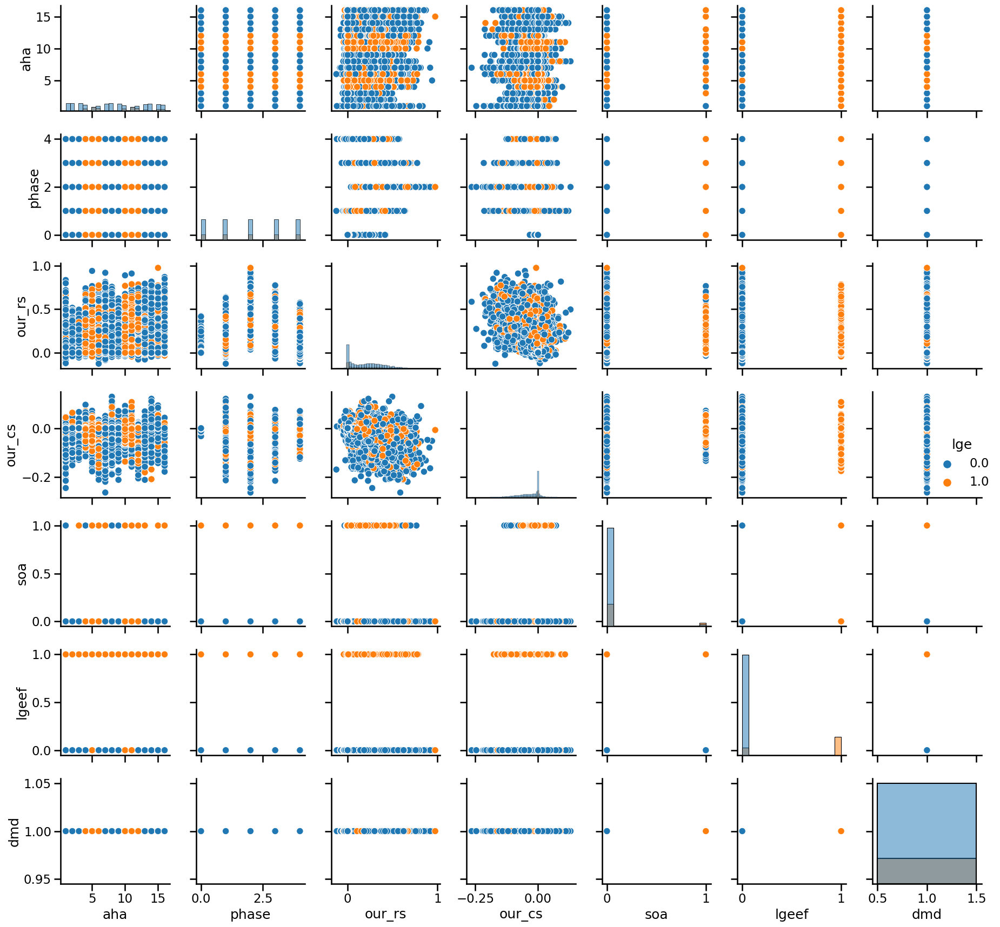

In [48]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_comp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## p2p Strain

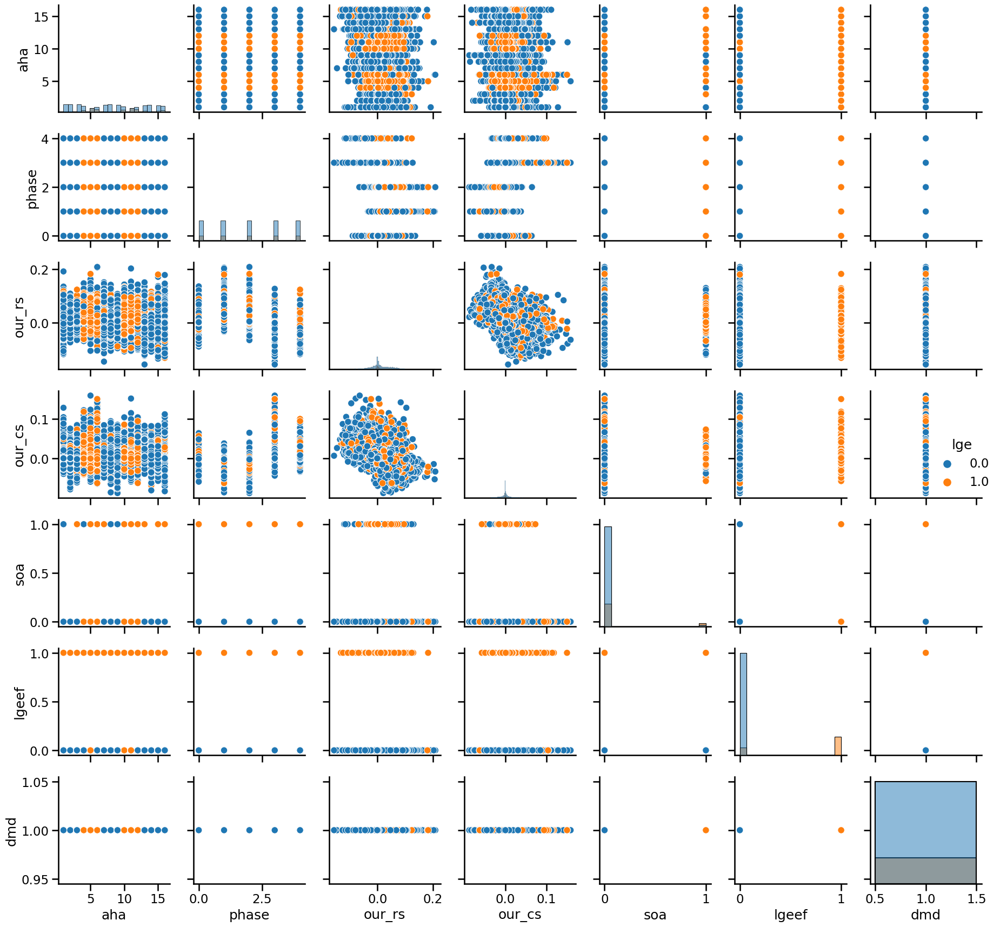

In [49]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_p2p,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## Peak Strain

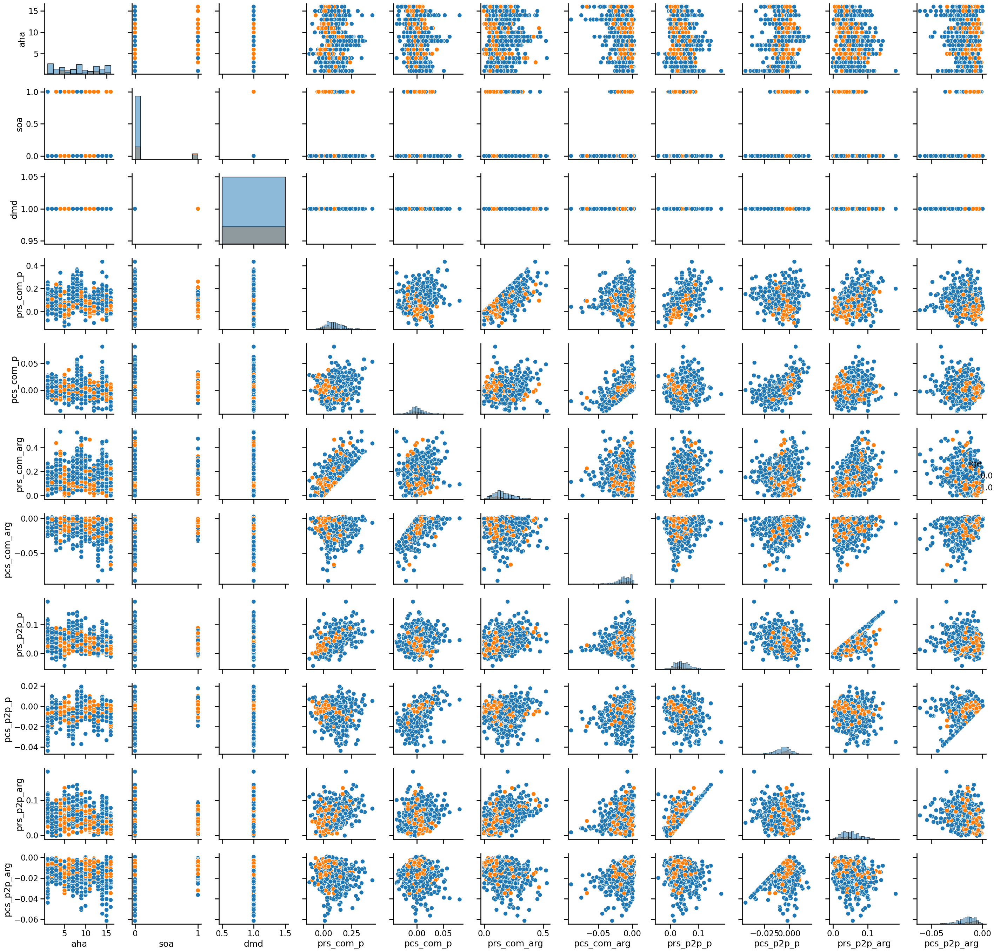

In [36]:
sb.set_context("talk")
g = sb.pairplot(data=df_peak,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

# Correlation plots

## Composed Strain

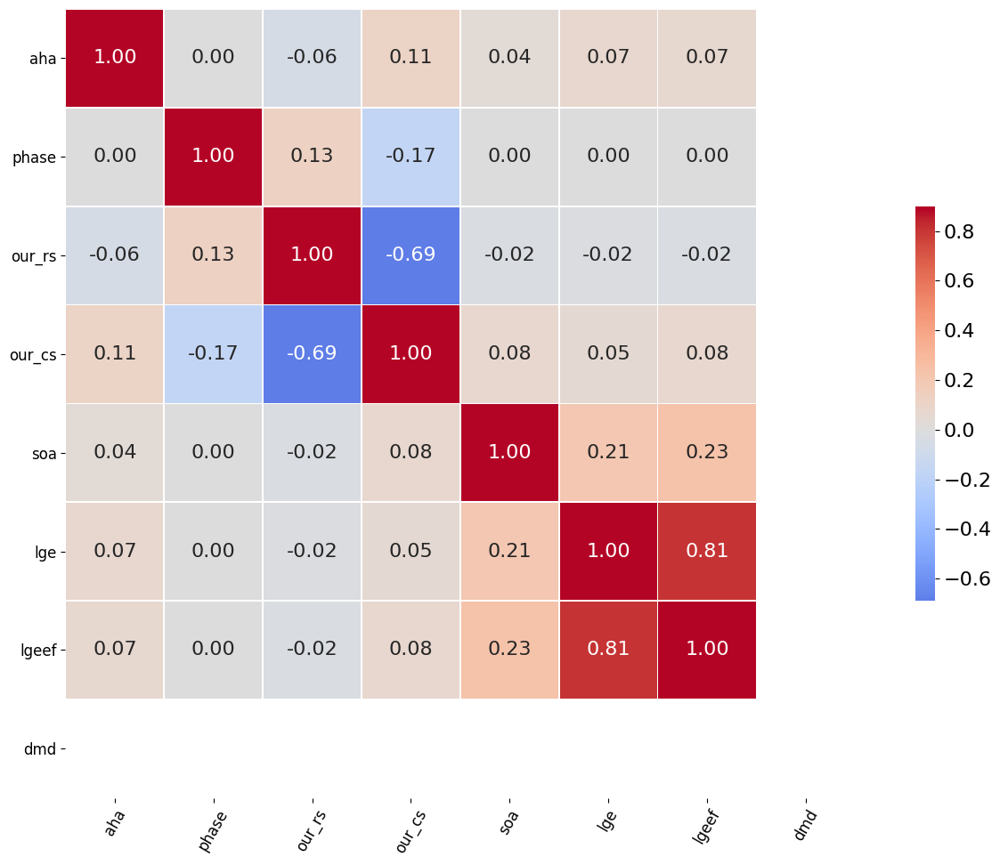

In [187]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_comp.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()
#fig.savefig('strain_corr_cvi_vs_ours.png')

## p2p Strain

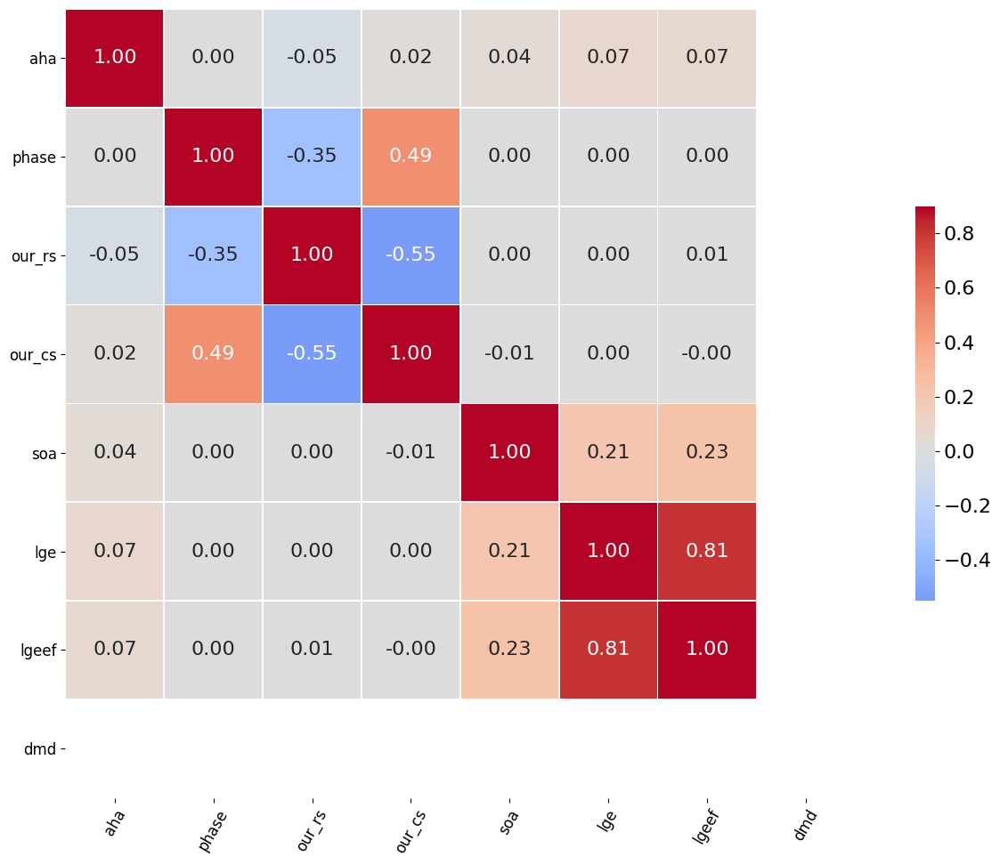

In [186]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_p2p.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

## Peak Strain

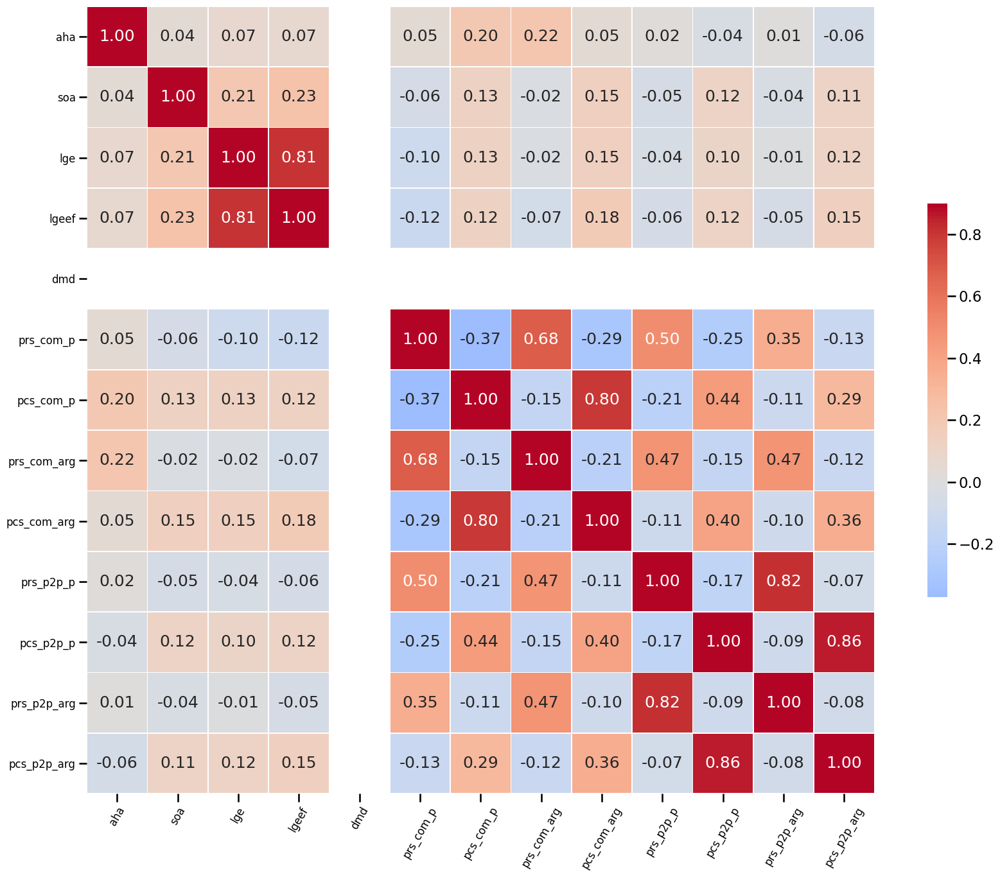

In [52]:
fig, ax = plt.subplots(figsize=(18,14)) 
corr = df_peak.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

# Strain per phase

Extract one feature Vector per Patient (56 patients times 16 segments times 5 phases times two feature (rs, cs))

- 32 LGE positive patients
- 24 LGE negative patients

## Strain per patient from composed df (56 x 16 x 5 x 2) --> 56, 160

In [13]:
# fit one model per segment
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score
from sklearn.tree import DecisionTreeClassifier
# iterate over the aha segments
# create a sub dataframe of PRS, PCS or comp, p2p
# with the shape: patients, features (56, 2 or 56,psp+com)
# extract x and y for this segment
estimators = []
preds = []
y_tests = []
patients = df_strain_p2p.pat.unique()
X_train, X_test, _, _ = train_test_split(
    patients, patients, test_size=0.2, random_state=42)
# iterate over the segments
for seg in df_strain_p2p.aha.unique():
    print("segment: {}".format(seg))
    # create a temp sub df for only the train patients
    df_strain_p2p_temp = df_strain_p2p[df_strain_p2p['pat'].isin(X_train)]
    df_strain_comp_temp = df_strain_comp[df_strain_comp['pat'].isin(X_train)]
    df_strain_p2p_test = df_strain_p2p[df_strain_p2p['pat'].isin(X_test)]
    df_strain_comp_test = df_strain_comp[df_strain_comp['pat'].isin(X_test)]
    
    # filter the current segment
    seg_of_interest= [seg]
    df_strain_p2p_temp = df_strain_p2p_temp[df_strain_p2p_temp['aha'].isin(seg_of_interest)]
    df_strain_comp_temp = df_strain_comp_temp[df_strain_comp_temp['aha'].isin(seg_of_interest)]
    df_strain_p2p_test = df_strain_p2p_test[df_strain_p2p_test['aha'].isin(seg_of_interest)]
    df_strain_comp_test = df_strain_comp_test[df_strain_comp_test['aha'].isin(seg_of_interest)]
    
    # 280,7 --> 56 patients x 5 phases = 280; and ['pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', 'lge']
    cs_p2p = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp = np.stack(df_strain_comp_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_ = cs_comp#np.concatenate([cs_p2p, cs_comp], axis=1)
    y_ = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_ = y_.sum(axis=1)>0
    
    cs_p2p_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp_test = np.stack(df_strain_comp_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_test = cs_comp_test#np.concatenate([cs_p2p_test, cs_comp_test], axis=1)
    y_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_test = y_test.sum(axis=1)>0
    if y_.sum()>4:
        clf_ = make_pipeline(MinMaxScaler(), DecisionTreeClassifier(class_weight='balanced'))
        clf_.fit(x_, y_)
        train_preds = clf_.predict(x_)
        estimators.append(('{}'.format(seg), clf_))
        pred_ = clf_.predict(x_test)
        preds.append(pred_)
        y_tests.append(y_test)
        print(accuracy_score(y_, train_preds))
        print(precision_score(y_, train_preds))
        print(accuracy_score(y_test, pred_))
        print(precision_score(y_test, pred_))
        #cross_validate_f1(x_,y_); plt.show()
    else:
        print('only {} pos examples, no splits possible'.format(y_.sum()))

segment: 4
1.0
1.0
0.5
0.0
segment: 5
1.0
1.0
0.75
1.0
segment: 6
1.0
1.0
0.8333333333333334
0.75
segment: 11
1.0
1.0
0.6666666666666666
0.6
segment: 12
1.0
1.0
0.3333333333333333
0.0


In [14]:
preds_stack = np.stack(preds, axis=0)
print(preds_stack.shape)
y_tests_stack = np.stack(y_tests, axis=0)
for p in range(y_tests_stack.shape[1]):
    print('--'*10)
    print(preds_stack[:,p].sum())
    print(y_tests_stack[:,p].sum())

(5, 12)
--------------------
1
0
--------------------
3
5
--------------------
1
3
--------------------
1
0
--------------------
1
0
--------------------
1
0
--------------------
3
0
--------------------
0
0
--------------------
2
5
--------------------
1
2
--------------------
1
3
--------------------
3
5


In [15]:
# check for nan and infinit values
x[~np.isfinite(x)]

array([], dtype=float32)

# Unsupervised Clustering

In [30]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

#temp_2d = TSNE(n_components=2, perplexity=4, learning_rate=50).fit_transform(x)
#temp_2d = PCA(n_components=2).fit_transform(x)
temp_2d = make_pipeline(
    #StandardScaler(),
    MinMaxScaler(),
    #NeighborhoodComponentsAnalysis(n_components=4, random_state=42),
    TSNE(n_components=2, perplexity=2, learning_rate=500, method='exact', init='pca')
    ).fit_transform(x)

NameError: name 'make_pipeline' is not defined

(57, 3)


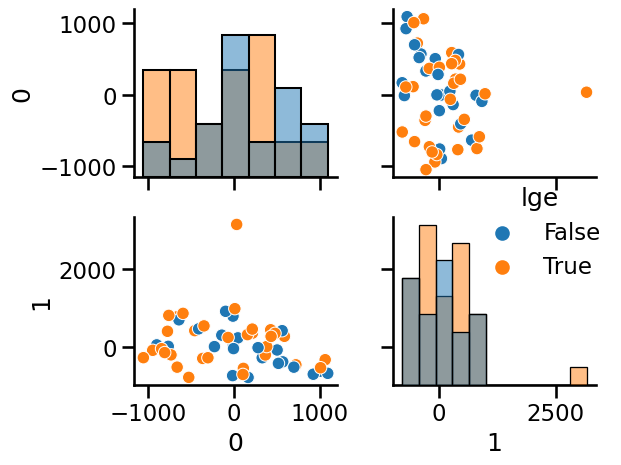

In [172]:
sb.set_context("talk")
df_temp = pd.DataFrame(temp_2d)
df_temp['lge'] = y
print(df_temp.shape)
g = sb.pairplot(data=df_temp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

In [ ]:
cross_validate_f1(temp_2d,y)

********** Logistic Regression **********
[0.57142857 0.71428571 0.5        0.5        0.42857143]
F1: 0.55 (+/- 0.08) [Logistic Regression]
Recall: 0.54 (+/- 0.10) [Logistic Regression]
Accuracy: 0.48 (+/- 0.11) [Logistic Regression]
********** Random Forest **********
[0.85714286 0.85714286 0.5        0.5        0.71428571]
F1: 0.69 (+/- 0.13) [Random Forest]
Recall: 0.69 (+/- 0.16) [Random Forest]
Accuracy: 0.66 (+/- 0.11) [Random Forest]
********** Naive Bayes **********
[0.85714286 0.85714286 1.         0.83333333 1.        ]
F1: 0.72 (+/- 0.06) [Naive Bayes]
Recall: 0.91 (+/- 0.07) [Naive Bayes]
Accuracy: 0.54 (+/- 0.08) [Naive Bayes]
********** Scaled DecissionTree **********
[0.85714286 0.57142857 0.5        0.5        0.71428571]
F1: 0.67 (+/- 0.13) [Scaled DecissionTree]
Recall: 0.63 (+/- 0.14) [Scaled DecissionTree]
Accuracy: 0.65 (+/- 0.16) [Scaled DecissionTree]
********** KNN **********
[0.71428571 0.42857143 0.5        0.5        0.57142857]
F1: 0.64 (+/- 0.11) [KNN]
Rec

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

# Model Essemble according to different metrics


    best_params = results.head(1)['params'].values[0]

--> Here we get a dict with parameters to create a classification pipeline 
--> e.g.: {'clf': SVC(C=1, class_weight='balanced', kernel='poly'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}

    gs.best_estimator_

--> returns a pipeline object, consiting of a scaler and a classifier step, both with preset params for the best pipeline according to the refit score of the gridsearch cv

    gs.best_estimator_.set_params(**best_params)

--> This will overwrite the scaler and classifier steps in the best pipeline

In [212]:
# best balanced accuracy
results.sort_values(by='rank_test_balanced_accuracy', inplace=True, ascending=True)
params_best_ba = results.head(1)['params'].values[0]
print(params_best_ba)
clf_best_ba = gs.best_estimator_.set_params(**params_best_ba)
clf_best_ba

{'clf': SVC(C=1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}


Pipeline(steps=[('scaler', None),
                ('clf', SVC(C=1, class_weight='balanced', kernel='poly'))])

In [213]:
# best f1
results.sort_values(by='rank_test_f1', inplace=True,ascending=True)
params_best_f1 = results.head(1)['params'].values[0]
print(params_best_f1)
clf_best_f1 = gs.best_estimator_.set_params(**params_best_f1)
clf_best_f1

{'clf': SVC(C=1, class_weight='balanced', kernel='poly'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}


Pipeline(steps=[('scaler', None),
                ('clf',
                 SVC(C=1, class_weight='balanced', degree=5, kernel='poly'))])

In [214]:
# best average precision
results.sort_values(by='rank_test_sens', inplace=True,ascending=True)
params_best_ap = results.head(1)['params'].values[0]
print(params_best_ap)
clf_best_ap = gs.best_estimator_.set_params(**params_best_ap)
clf_best_ap

{'clf': SVC(C=1, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 0.001, 'clf__kernel': 'sigmoid', 'scaler': StandardScaler()}


Pipeline(steps=[('scaler', StandardScaler()),
                ('clf',
                 SVC(C=0.1, class_weight='balanced', degree=5, gamma=0.001,
                     kernel='sigmoid'))])

In [215]:
from sklearn.ensemble import VotingClassifier
eclf = VotingClassifier(
        estimators=[
            ('ba', clf_best_ba), 
            ('f1', clf_best_f1),
            ('ap', clf_best_ap)
                   ],
        voting='hard')

Specifity: 0.00 (+/- 0.00)
Sensitivity: 1.00 (+/- 0.00)
params: 
Recall: 1.00 (+/- 0.00)
Accuracy: 0.57 (+/- 0.01)
Precision: 0.57 (+/- 0.01)
Balanced Accuracy: 0.50 (+/- 0.00)
F1: 0.72 (+/- 0.01)
AUC: 0.50 (+/- 0.00)


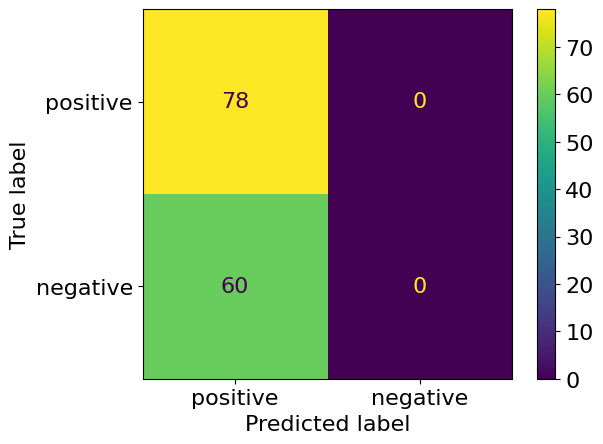

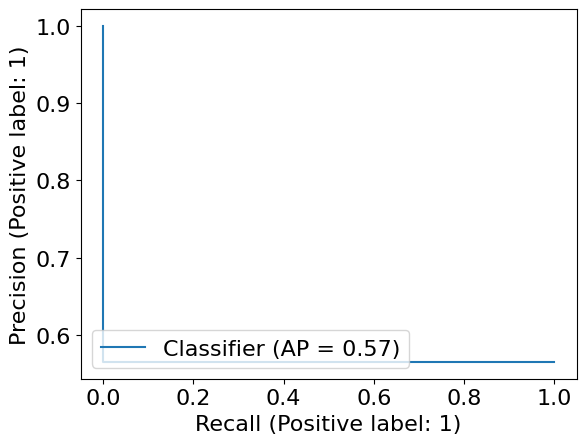

In [217]:
plot_report(eclf, x, y);plt.show()

In [47]:
# re-calculate the scores of the current best clinical practice
from sklearn.metrics import (precision_recall_curve,
                                 PrecisionRecallDisplay)

def my_spec(gt,pred):
        tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
        specificity = tn / (tn+fp)
        return specificity
def my_sens(gt,pred):
    tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
    sensitivity = tp / (tp+fn)
    return sensitivity

TP = 26
FN = 6
FP = 9
TN = 15

tp = [1]*TP
y_pred = tp
y = tp

tn = [0]*TN
y_pred = y_pred + tn
y = y + tn

fp_pred = [1]*FP
fp_y = [0]*FP
y_pred = y_pred + fp_pred
y = y + fp_y

fn_pred = [0]*FN
fn_y = [1]*FN
y_pred = y_pred + fn_pred
y = y + fn_y


import sklearn
CBP_results = sklearn.metrics.precision_recall_fscore_support(y,y_pred, average='binary')
print('specifity: {:.2f}'.format(my_spec(y, y_pred)))
print('sensitivity: {:.2f}'.format(my_sens(y, y_pred)))
print('Precision: {:.2f}\nRecall: {:.2f}'.format(CBP_results[0], CBP_results[1]))
print('F1 Score: {:.2f}'.format(sklearn.metrics.f1_score(y,y_pred)))
print('Accuracy: {:.2f}'.format(sklearn.metrics.accuracy_score(y,y_pred)))
print('Balanced accuracy: {:.2f}'.format(sklearn.metrics.balanced_accuracy_score(y,y_pred)))
print('AUC: {:.2f}'.format(sklearn.metrics.roc_auc_score(y,y_pred)))
disp = ConfusionMatrixDisplay.from_predictions(y, y_pred,labels=[1,0], display_labels=['positive','negative'],colorbar=True)
disp = PrecisionRecallDisplay.from_predictions(y,y_pred)


# calculate the measures for the Current best practice



# Precision = TP / (TP+FP) 


sensitivity: 0.81
specifity: 0.62
Precision: 0.74
Recall: 0.81
F1 Score: 0.78
Accuracy: 0.73
Balanced accuracy: 0.72
AUC: 0.72
